In [1]:
import numpy as np 
import pandas as pd 
import torch
import torch.nn as nn
from torch.nn.init import orthogonal_
import torch.linalg
from tqdm.auto import tqdm

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
import warnings
from sklearn.exceptions import ConvergenceWarning

# Suppress convergence warnings from scikit-learn
warnings.filterwarnings("ignore", category=ConvergenceWarning)

In [2]:
import random
## Setting seed for reproducability
seed = 42
random.seed(seed); np.random.seed(seed); torch.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [3]:
pip install sktime -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.3/36.3 MB 54.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.5/151.5 kB 5.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install torchsummary -q

Note: you may need to restart the kernel to use updated packages.


## First we implement all the algorithms in code: NW-RNN, NW-ESN, RNN and ESN, then run these algorithms on 4 different datasets: FordA, Synthetic Control, ECG5000 and Earthquakes, 2 of which have been shown here

## NWCell Network

In [5]:
class NWCell(nn.Module):
    """
    Implements a single step of the Nanowire Neural Network cell.
    Based on Equations 7-11 from the paper.
    """
    def __init__(self, input_size, hidden_size, hp):
        super(NWCell, self).__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        
        # --- Weights and Biases ---
        # W_x * x(t+1) [cite: 85]
        self.W_x = nn.Linear(input_size, hidden_size, bias=True) 
        # W_h * h(t) [cite: 85]
        # Note: The paper adds the bias 'b' to the sum[cite: 85],
        # so we only add bias to one of the linear layers (W_x here).
        self.W_h = nn.Linear(hidden_size, hidden_size, bias=False)

        # --- Nanowire Hyperparameters [cite: 93, 128] ---
        self.Kp0 = hp['Kp0']
        self.Kd0 = hp['Kd0']
        self.eta_p = hp['eta_p']
        self.eta_d = hp['eta_d']
        self.delta_t = hp['delta_t']
        self.gamma = hp['gamma']
        
        # --- RESCALE Hyperparameters (Eq. 11) [cite: 102, 103] ---
        self.rescale_a = hp.get('rescale_a', 0.35)
        self.rescale_b = hp.get('rescale_b', 1.15)
        self.rescale_s = hp['rescale_s']

    def rescale(self, y):
        """
        Implements the RESCALE function (Eq. 11) [cite: 100-103].
        Uses torch.sigmoid(y*s) which is equivalent to 1 / (1 + exp(-y*s)).
        """
        return (self.rescale_b - self.rescale_a) * torch.sigmoid(y * self.rescale_s) + self.rescale_a

    def forward(self, input, hx):
        """
        Performs one time step.
        :param input: x(t+1), tensor of shape (batch_size, input_size)
        :param hx: h(t), tensor of shape (batch_size, hidden_size)
        :return: h(t+1), tensor of shape (batch_size, hidden_size)
        """
        
        # 1. Calculate z(t+1) = W_h*h(t) + W_x*x(t+1) + b
        #    (Eq. 7) [cite: 85]
        z_t1_affine = self.W_h(hx) + self.W_x(input)
        
        # 2. Apply RESCALE
        #    z(t+1) = RESCALE(...) (Eq. 7) [cite: 85, 98]
        z_t1 = self.rescale(z_t1_affine)
        
        # 3. Calculate potentiation and depression rates
        #    (Eq. 5, 6) [cite: 58, 59]
        Kp = self.Kp0 * torch.exp(self.eta_p * z_t1)
        Kd = self.Kd0 * torch.exp(-self.eta_d * z_t1)

        # 4. Calculate r(t+1)
        #    This combines Eq. 8 and 9 [cite: 86, 87]
        #    r(t+1) = Kp(z) - q(t+1)
        #    q(t+1) = (Kp(z) + Kd(z)) * h(t)
        #    So: r(t+1) = Kp(z) - (Kp(z) + Kd(z)) * h(t)
        #    r(t+1) = Kp(z) * (1 - h(t)) - Kd(z) * h(t)
        #    This matches the continuous form in Eq. 4 [cite: 57]
        r_t1 = Kp * (1.0 - hx) - Kd * hx
        
        # 5. Calculate the next hidden state h(t+1)
        #    (Eq. 10) [cite: 88]
        h_t1 = self.gamma * hx + r_t1 * self.delta_t
        
        # Ensure state h stays within [0, 1] as mentioned in [cite: 48, 62]
        # This is a practical constraint to maintain stability
        h_t1_clipped = torch.clamp(h_t1, 0.0, 1.0)

        return h_t1_clipped

In [6]:
class NW_Network(nn.Module):
    """
    A full Nanowire Network model that processes sequences.
    This can be configured as an NW-RNN (fully trainable) or
    an NW-ESN (fixed reservoir).
    """
    def __init__(self, input_size, hidden_size, output_size, hp):
        super(NW_Network, self).__init__()
        self.hidden_size = hidden_size
        self.cell = NWCell(input_size, hidden_size, hp)
        
        # Readout layer applied to the final state 
        self.readout = nn.Linear(hidden_size, output_size)

    def forward(self, x, h0=None):
        """
        Processes a batch of sequences.
        :param x: Input tensor of shape (batch_size, seq_length, input_size)
        :param h0: (Optional) Initial hidden state
        :return: Output tensor of shape (batch_size, output_size)
        """
        batch_size = x.size(0)
        seq_length = x.size(1)

        # Initialize hidden state h(0)
        if h0 is None:
            h = torch.full((batch_size, self.hidden_size), 0.5, device=x.device)
        else:
            h = h0

        # Loop over the sequence
        for t in range(seq_length):
            h = self.cell(x[:, t, :], h)
            
        output = self.readout(h)
        
        return output


In [7]:
def count_parameters(model):
    """Counts the total and trainable parameters of a PyTorch model."""
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total_params, trainable_params

## RNN model

In [8]:
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from tqdm.auto import tqdm
class StandardRNN(nn.Module):
    """
    A standard RNN model for comparison.
    Uses nn.RNN with 'tanh' nonlinearity and a readout on the final hidden state.
    """
    def __init__(self, input_size, hidden_size, output_size):
        super(StandardRNN, self).__init__()
        self.hidden_size = hidden_size
        
        # Standard PyTorch RNN layer
        self.rnn = nn.RNN(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=1,
            batch_first=True, # Expects (batch, seq, feature)
            nonlinearity='tanh'
        )
        
        # Readout layer applied to the final state
        self.readout = nn.Linear(hidden_size, output_size)

    def forward(self, x, h0=None):
        """
        Processes a batch of sequences.
        :param x: Input tensor of shape (batch_size, seq_length, input_size)
        """
        # RNN returns (all_outputs, h_final)
        # h_final is shape (num_layers, batch_size, hidden_size)
        _, h_final = self.rnn(x, h0)
        
        h_final = h_final.squeeze(0) 
        
        # Output is based on the final hidden state
        output = self.readout(h_final)
        return output

## ESN Cell

In [9]:
class ESNCell(nn.Module):
    """
    [cite_start]A single Leaky-Integrator ESN cell. [cite: 122]
    h(t+1) = (1-a) * h(t) + a * tanh(W_h*h(t) + W_x*x(t+1) + b)
    """
    def __init__(self, input_size, hidden_size, hp):
        super(ESNCell, self).__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.leaking_rate = hp['leaking_rate'] 
        
        self.W_x = nn.Linear(input_size, hidden_size, bias=True)
        self.W_h = nn.Linear(hidden_size, hidden_size, bias=False)

    def forward(self, input, hx):
        pre_activation = self.W_h(hx) + self.W_x(input)
        h_t1 = (1.0 - self.leaking_rate) * hx + \
               self.leaking_rate * torch.tanh(pre_activation)
        return h_t1


## ESN Network

In [10]:
class ESN_Network(nn.Module):
    """ Full ESN wrapper """
    def __init__(self, input_size, hidden_size, output_size, hp):
        super(ESN_Network, self).__init__()
        self.hidden_size = hidden_size
        self.cell = ESNCell(input_size, hidden_size, hp)
        self.readout = nn.Linear(hidden_size, output_size)

    def forward(self, x, h0=None):
        batch_size = x.size(0)
        seq_length = x.size(1)

        if h0 is None:
            # Initialize hidden state h(0) to zeros
            h = torch.zeros(batch_size, self.hidden_size, device=x.device)
        else:
            h = h0

        for t in range(seq_length):
            h = self.cell(x[:, t, :], h)
            
        # [cite_start]Output is based on the final hidden state [cite: 124]
        output = self.readout(h)
        return output

## Training the reservoir layer of a ESN/NW-ESN model

In [11]:
def train_reservoir_readout(model, train_loader, val_loader, device, verbose=False):
    """
    Trains the readout layer of a reservoir model (ESN or NW-ESN)
    using a one-shot linear regression.
    
    Added `verbose` flag to silence output during grid search.
    """
    if verbose:
        print(f"Starting one-shot training for {model.__class__.__name__}...")
    
    model.eval()
    all_states, all_labels = [], []
    
    if verbose:
        print("  -> Step 1/3: Collecting hidden states...")
    
    with torch.no_grad():
        train_iterator = tqdm(train_loader, desc="Collecting States", leave=False) if verbose else train_loader
        
        for X_batch, y_batch in train_iterator:
            X_batch = X_batch.to(device)
            original_readout = model.readout
            model.readout = nn.Identity()
            h_final = model(X_batch)
            model.readout = original_readout
            all_states.append(h_final.cpu().numpy())
            all_labels.append(y_batch.cpu().numpy())

    X_train_states = np.concatenate(all_states)
    y_train_labels = np.concatenate(all_labels).ravel()

    if verbose:
        print("  -> Step 2/3: Fitting readout layer...")
        
    readout_model = Pipeline([
        ('scaler', StandardScaler()),
        ('logistic', LogisticRegression(penalty='l2', C=1e-5, max_iter=1000, solver='liblinear'))
    ])
    readout_model.fit(X_train_states, y_train_labels)
    
    # --- Copy weights back to PyTorch model ---
    logistic_weights = readout_model.named_steps['logistic'].coef_
    logistic_bias = readout_model.named_steps['logistic'].intercept_
    scaler_mean = readout_model.named_steps['scaler'].mean_
    scaler_std = readout_model.named_steps['scaler'].scale_
    
    num_classes = model.readout.weight.shape[0]

    if num_classes == 2 and logistic_weights.shape[0] == 1:
        w_1 = torch.tensor(logistic_weights / scaler_std, dtype=torch.float32, device=device)
        b_1_adjustment = np.sum(logistic_weights * scaler_mean / scaler_std)
        b_1 = torch.tensor(logistic_bias - b_1_adjustment, dtype=torch.float32, device=device)
        with torch.no_grad():
            model.readout.weight.data[0, :] = -w_1.squeeze(0)
            model.readout.weight.data[1, :] = w_1.squeeze(0)
            model.readout.bias.data[0] = -b_1
            model.readout.bias.data[1] = b_1
    else:
        with torch.no_grad():
            model.readout.weight.data = torch.tensor(
                logistic_weights / scaler_std, dtype=torch.float32
            ).to(device)
            b_adjustment = np.sum(logistic_weights * scaler_mean / scaler_std, axis=1)
            model.readout.bias.data = torch.tensor(
                logistic_bias - b_adjustment, dtype=torch.float32
            ).to(device)

    if verbose:
        print("  -> Step 3/3: Readout trained.")

    # --- Evaluate on validation set ---
    val_correct, val_total = 0, 0
    model.eval()
    with torch.no_grad():
        for X_batch, y_batch in val_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            output = model(X_batch)
            _, predicted = torch.max(output.data, 1)
            val_total += y_batch.size(0)
            val_correct += (predicted == y_batch).sum().item()
            
    val_acc = 100 * val_correct / val_total
    
    if verbose:
        print(f"  -> Validation Accuracy: {val_acc:.2f}%")
    
    return model, val_acc

## Carrying out Hyperparamter grid search for ESN, NW-ESN networks


In [12]:
import copy
from itertools import product


def run_reservoir_experiments(train_loader, val_loader, test_loader, input_size, num_classes):
    """
    Main script to run a grid search for the best ESN and NW-ESN models.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Running experiments on device: {device}\n")
    N_NEURONS = 100
    
    best_models = {}

    # --- 1. NW-ESN Grid Search (Based on Table 3a) ---
    print("--- 1. Starting NW-ESN Grid Search (from Table 3a) ---")
    
    # Hyperparameters from Table 3a 
    hp_space_nw_esn = {
        'input_scaling': [1.0, 10.0],
        'bias_scaling': [0.001, 0.1, 1.0], 
        'spectral_radius': [0.8, 0.9, 0.95, 0.99],
        'gamma': [0.1, 0.5, 0.8, 0.95, 1.0],
        'delta_t': [0.1, 0.01, 0.001]
    }
    
    # Fixed params from Table 2 and 3a
    fixed_nw_esn_params = {
        'Kp0': 0.0001, 'Kd0': 0.5, 'eta_p': 10.0, 'eta_d': 1.0,
        'rescale_s': 1.5 
    }

    best_nw_esn_val_acc = -1.0
    best_nw_esn_params = None
    best_nw_esn_state = None

    param_combinations_nw_esn = list(product(
        hp_space_nw_esn['input_scaling'],
        hp_space_nw_esn['bias_scaling'],
        hp_space_nw_esn['spectral_radius'],
        hp_space_nw_esn['gamma'],
        hp_space_nw_esn['delta_t']
    ))
    
    print(f"Total combinations to check: {len(param_combinations_nw_esn)}")

    for w, beta, p, gamma, delta_t in tqdm(param_combinations_nw_esn, desc="NW-ESN Grid Search"):
        current_hp = {
            **fixed_nw_esn_params,
            'gamma': gamma,
            'delta_t': delta_t
        }
        
        nw_esn = NW_Network(input_size, N_NEURONS, num_classes, current_hp)

        for name, param in nw_esn.cell.named_parameters():
            if 'W_h.weight' in name:
                orthogonal_(param)
                with torch.no_grad():
                    eigvals = torch.linalg.eigvals(param.data)
                    param.data = (p / torch.max(torch.abs(eigvals))) * param.data
            elif 'W_x.weight' in name:
                with torch.no_grad():
                    param.data = (torch.rand(param.shape, device=param.device) - 0.5) * 2.0 * w
            elif 'W_x.bias' in name:
                with torch.no_grad():
                    param.data = (torch.rand(param.shape, device=param.device) - 0.5) * 2.0 * beta
            param.requires_grad = False
        
        nw_esn.to(device)
        
        # Train and get val accuracy (use verbose=False from the train_reservoir_readout func)
        trained_model, val_acc = train_reservoir_readout(nw_esn, train_loader, val_loader, device, verbose=False)
        
        if val_acc > best_nw_esn_val_acc:
            best_nw_esn_val_acc = val_acc
            best_nw_esn_params = {'w': w, 'beta': beta, 'p': p, **current_hp}
            best_nw_esn_state = copy.deepcopy(trained_model.state_dict())
            
    print(f"--- NW-ESN Search Complete ---")
    print(f"Best NW-ESN Val Acc: {best_nw_esn_val_acc:.2f}%")
    print(f"Best NW-ESN Params: {best_nw_esn_params}\n")
    
    # Save the best model
    best_models['NW-ESN'] = (best_nw_esn_val_acc, best_nw_esn_params, best_nw_esn_state)


    # --- 2. ESN Grid Search (Based on the image, Table 3c) ---
    print("--- 2. Starting ESN Grid Search (from Table 3c) ---")
    
    # [cite_start]Hyperparameters from Table 3c [cite: 143-150]
    hp_space_esn = {
        'input_scaling': [1.0, 10.0],
        'bias_scaling': [0.001, 0.1, 1.0],
        'spectral_radius': [0.8, 0.9, 0.95, 0.99],
        'leaking_rate': [0.1, 0.3, 0.5]
    }

    best_esn_val_acc = -1.0
    best_esn_params = None
    best_esn_state = None
    
    param_combinations_esn = list(product(
        hp_space_esn['input_scaling'],
        hp_space_esn['bias_scaling'],
        hp_space_esn['spectral_radius'],
        hp_space_esn['leaking_rate']
    ))
    
    print(f"Total combinations to check: {len(param_combinations_esn)}")

    for w, beta, p, a in tqdm(param_combinations_esn, desc="ESN Grid Search"):
        current_hp = {'leaking_rate': a}
        std_esn = ESN_Network(input_size, N_NEURONS, num_classes, current_hp)

        for name, param in std_esn.cell.named_parameters():
            if 'W_h.weight' in name:
                orthogonal_(param)
                with torch.no_grad():
                    eigvals = torch.linalg.eigvals(param.data)
                    param.data = (p / torch.max(torch.abs(eigvals))) * param.data
            elif 'W_x.weight' in name:
                with torch.no_grad():
                    param.data = (torch.rand(param.shape, device=param.device) - 0.5) * 2.0 * w
            elif 'W_x.bias' in name:
                with torch.no_grad():
                    param.data = (torch.rand(param.shape, device=param.device) - 0.5) * 2.0 * beta
            param.requires_grad = False
        
        std_esn.to(device)
        
        # Train and get val accuracy (use verbose=False)
        trained_model, val_acc = train_reservoir_readout(std_esn, train_loader, val_loader, device, verbose=False)
        
        if val_acc > best_esn_val_acc:
            best_esn_val_acc = val_acc
            best_esn_params = {'w': w, 'beta': beta, 'p': p, **current_hp}
            best_esn_state = copy.deepcopy(trained_model.state_dict())

    print(f"--- ESN Search Complete ---")
    print(f"Best ESN Val Acc: {best_esn_val_acc:.2f}%")
    print(f"Best ESN Params: {best_esn_params}\n")
    
    # Save the best model
    best_models['ESN'] = (best_esn_val_acc, best_esn_params, best_esn_state)

    
    # --- 3. Final Evaluation on Test Set ---
    print("--- 3. Final Evaluation on Test Set (using best models) ---")
    print("======================================================")
    
    for model_name, (val_acc, params, state) in best_models.items():
        
        # Re-build the best model
        if model_name == 'NW-ESN':
            model = NW_Network(input_size, N_NEURONS, num_classes, params)
        else: # ESN
            model = ESN_Network(input_size, N_NEURONS, num_classes, params)
        
        model.load_state_dict(state)
        model.to(device)
        model.eval()
        
        test_correct, test_total = 0, 0
        with torch.no_grad():
            for X_batch, y_batch in tqdm(test_loader, desc=f"Testing {model_name}"):
                X_batch, y_batch = X_batch.to(device), y_batch.to(device)
                output = model(X_batch)
                _, predicted = torch.max(output.data, 1)
                test_total += y_batch.size(0)
                test_correct += (predicted == y_batch).sum().item()
                
        test_acc = 100 * test_correct / test_total
        print(f"  Model: {model_name}")
        print(f"    -> Best Validation Accuracy: {val_acc:.2f}%")
        print(f"    -> Final Test Accuracy: {test_acc:.2f}%")
        print(f"    -> Best Params: {params}")
        print("------------------------------------------------------")
        return best_models

## Data preprocessing function

In [13]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

def load_and_preprocess_ucr_tsv(train_path, test_path, validation_split=0.2):
    """
    Loads UCR TSV data, applies Z-normalization, and splits the train set.
    """
    # Load data using pandas for TSV files
    train_df = pd.read_csv(train_path, sep='\t', header=None)
    test_df = pd.read_csv(test_path, sep='\t', header=None)

    X_train_full = train_df.iloc[:, 1:].to_numpy()
    y_train_full = train_df.iloc[:, 0].to_numpy()
    
    X_test = test_df.iloc[:, 1:].to_numpy()
    y_test = test_df.iloc[:, 0].to_numpy()

    # Normalize the data (Z-score normalization)
    scaler = StandardScaler()
    scaler.fit(X_train_full)
    
    X_train_full_norm = scaler.transform(X_train_full)
    X_test_norm = scaler.transform(X_test)

    # Create the 80/20 train/validation split
    X_train_norm, X_val_norm, y_train_split, y_val_split = train_test_split(
        X_train_full_norm,
        y_train_full, # Use the original full training labels
        test_size=validation_split,
        random_state=42,
        stratify=y_train_full # Stratify on the full label set
    )

    print(f"Full train set: {X_train_full_norm.shape}")
    print(f"Train set (80%): {X_train_norm.shape}")
    print(f"Validation set (20%): {X_val_norm.shape}")
    print(f"Test set: {X_test_norm.shape}")

    return (X_train_norm, y_train_split,
            X_val_norm, y_val_split,
            X_test_norm, y_test)

## Create dataloaders

In [14]:
import time
import torch
from torch.utils.data import TensorDataset, DataLoader

def create_dataloaders(X, y, batch_size=64, is_classification=True):
    """
    Converts numpy data to PyTorch DataLoaders.
    """
    X_tensor = torch.tensor(X, dtype=torch.float32).unsqueeze(-1)
    
    if is_classification:
        # Convert string labels ('-1.0', '1.0') to integer indices (0, 1)
        # This is required for CrossEntropyLoss
        unique_labels = sorted(list(np.unique(y)))
        label_map = {label: i for i, label in enumerate(unique_labels)}
        y_int = np.array([label_map[label] for label in y])
        
        y_tensor = torch.tensor(y_int, dtype=torch.long)
    else:
        y_tensor = torch.tensor(y.astype(float), dtype=torch.float32)

    # 3. Create Dataset and DataLoader
    dataset = TensorDataset(X_tensor, y_tensor)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    
    return dataloader, (X_tensor.shape[2], len(unique_labels) if is_classification else 1)

In [15]:
train_file_paths = ['/kaggle/input/earthquakes/Earthquakes_TRAIN.tsv', '/kaggle/input/forda-ucr/FordA_TRAIN.tsv']
test_file_paths = ['/kaggle/input/earthquakes/Earthquakes_TEST.tsv', '/kaggle/input/forda-ucr/FordA_TEST.tsv']
names = ['Earthquakes', 'FordA']

In [16]:
from torchsummary import summary
def run_experiment_rnn_models(TRAIN_FILE_PATH, TEST_FILE_PATH):
    X_train, y_train, X_val, y_val, X_test, y_test = load_and_preprocess_ucr_tsv(TRAIN_FILE_PATH, TEST_FILE_PATH)
    train_loader, (input_size, num_classes) = create_dataloaders(
        X_train, y_train, batch_size=64, is_classification=True
    )
    val_loader, _ = create_dataloaders(
        X_val, y_val, batch_size=64, is_classification=True
    )
    test_loader, _ = create_dataloaders(
        X_test, y_test, batch_size=64, is_classification=True
    )
    
    print(f"\nData ready for PyTorch:")
    print(f"Input size: {input_size}")
    print(f"Output classes: {num_classes}")
    
    N_NEURONS = 100
    # --- Initialize Standard RNN Model for Classification ---
    print("\n--- Training Standard RNN ---")
    std_rnn_classifier = StandardRNN(input_size, N_NEURONS, num_classes)
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    std_rnn_classifier.to(device)
    print(f"Using device: {device}")
    
    learning_rate = 5e-4 
    epochs = 200           
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(std_rnn_classifier.parameters(), lr=learning_rate)
    train_loss_history = []
    val_loss_history = []
    print(f"\nStarting Standard RNN Classifier Training for {epochs} epochs...")
    
    rnn_train_loss_history = []
    rnn_val_loss_history = []
    # ----------------------------------------
    std_rnn_classifier.train()
    for epoch in range(epochs):
        
        std_rnn_classifier.train()  
        total_train_loss = 0
        progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} (Train)", leave=False)
        
        for X_batch, y_batch in progress_bar:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device) 
            
            optimizer.zero_grad()
            output = std_rnn_classifier(X_batch)
            loss = criterion(output, y_batch)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(std_rnn_classifier.parameters(), max_norm=1.0)
            optimizer.step()
            
            total_train_loss += loss.item()
            progress_bar.set_postfix(loss=f"{loss.item():.6f}")
    
        avg_train_loss = total_train_loss / len(train_loader)
        rnn_train_loss_history.append(avg_train_loss) 
    
        std_rnn_classifier.eval() # Set model to evaluation mode
        total_val_loss = 0
        total_val_correct = 0
        total_val_samples = 0
        
        with torch.no_grad(): 
            for X_batch, y_batch in val_loader: 
                X_batch, y_batch = X_batch.to(device), y_batch.to(device)
                
                output = std_rnn_classifier(X_batch)
                loss = criterion(output, y_batch)
                total_val_loss += loss.item()
                
                # Calculate accuracy
                _, predicted = torch.max(output.data, 1)
                total_val_samples += y_batch.size(0)
                total_val_correct += (predicted == y_batch).sum().item()
    
        avg_val_loss = total_val_loss / len(val_loader)
        rnn_val_loss_history.append(avg_val_loss) # Store validation loss
        val_accuracy = 100 * total_val_correct / total_val_samples
    
        print(f"Epoch {epoch+1}/{epochs} | Train Loss: {avg_train_loss:.6f} | Val Loss: {avg_val_loss:.6f} | Val Acc: {val_accuracy:.2f}%")
    
    print("Training complete.")
    
    # --- Evaluation---
    std_rnn_classifier.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for X_batch, y_batch in tqdm(test_loader, desc="Evaluating RNN"):
            X_batch, y_batch = X_batch.to(device), y_batch.to(device) 
    
            output = std_rnn_classifier(X_batch)
            _, predicted = torch.max(output.data, 1)
            total += y_batch.size(0)
            correct += (predicted == y_batch).sum().item()
    
    accuracy = 100 * correct / total
    print(f"Standard RNN Test Accuracy: {accuracy:.2f}%")

    print("\n--- Training NW-RNN model ---")
    hp_rnn = {
    'Kp0': 0.0001, 'Kd0': 0.5, 'eta_p': 10.0, 'eta_d': 1.0, # Table 2
    'gamma': 0.95, 'rescale_s': 1.0, 'delta_t': 0.1         # Table 3b
    }
    N_NEURONS = 100 
    
    nw_rnn_classifier = NW_Network(input_size, N_NEURONS, num_classes, hp_rnn)
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    nw_rnn_classifier.to(device)
    print(f"Using device: {device}")
    # ----------------------------------------------------
    
    # --- Setup Training ---
    learning_rate = 5e-4 #
    epochs = 200           
    criterion = nn.CrossEntropyLoss() 
    optimizer = torch.optim.Adam(nw_rnn_classifier.parameters(), lr=learning_rate)
    
    print(f"\nStarting NW-RNN Classifier Training for {epochs} epochs...")
    
    nw_rnn_train_loss_history = []
    nw_rnn_val_loss_history = []
    
    nw_rnn_classifier.train()
    for epoch in range(epochs):
        
        nw_rnn_classifier.train() 
        total_train_loss = 0
        progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} (Train)", leave=False)
        
        for X_batch, y_batch in progress_bar:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device) 
            
            optimizer.zero_grad()
            output = nw_rnn_classifier(X_batch)
            loss = criterion(output, y_batch)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(nw_rnn_classifier.parameters(), max_norm=1.0)
            optimizer.step()
            
            total_train_loss += loss.item()
            progress_bar.set_postfix(loss=f"{loss.item():.6f}")
    
        avg_train_loss = total_train_loss / len(train_loader)
        nw_rnn_train_loss_history.append(avg_train_loss) 
    
        nw_rnn_classifier.eval() 
        total_val_loss = 0
        total_val_correct = 0
        total_val_samples = 0
        
        with torch.no_grad(): 
            for X_batch, y_batch in val_loader: 
                X_batch, y_batch = X_batch.to(device), y_batch.to(device)
                
                output = nw_rnn_classifier(X_batch)
                loss = criterion(output, y_batch)
                total_val_loss += loss.item()
                
                # Calculate accuracy
                _, predicted = torch.max(output.data, 1)
                total_val_samples += y_batch.size(0)
                total_val_correct += (predicted == y_batch).sum().item()
    
        avg_val_loss = total_val_loss / len(val_loader)
        nw_rnn_val_loss_history.append(avg_val_loss) # Store validation loss
        val_accuracy = 100 * total_val_correct / total_val_samples
    
        print(f"Epoch {epoch+1}/{epochs} | Train Loss: {avg_train_loss:.6f} | Val Loss: {avg_val_loss:.6f} | Val Acc: {val_accuracy:.2f}%")
    
    print("Training complete.")
    
    # --- Evaluation (with tqdm) ---
    nw_rnn_classifier.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        
        for X_batch, y_batch in tqdm(test_loader, desc="Evaluating"):
            
            X_batch, y_batch = X_batch.to(device), y_batch.to(device) 
            # ---------------------------------------------------
    
            output = nw_rnn_classifier(X_batch)
            _, predicted = torch.max(output.data, 1)
            total += y_batch.size(0)
            correct += (predicted == y_batch).sum().item()
    
    accuracy = 100 * correct / total
    print(f"NW-RNN Test Accuracy: {accuracy:.2f}%")
    import matplotlib.pyplot as plt
    
    plt.figure(figsize=(10, 6))
    plt.plot(rnn_train_loss_history, label='RNN Train Loss', linestyle='--')
    plt.plot(rnn_val_loss_history, label='RNN Validation Loss', linewidth=2)
    plt.plot(nw_rnn_train_loss_history, label='NW-RNN Train Loss', linestyle='--')
    plt.plot(nw_rnn_val_loss_history, label='NW-RNN Validation Loss', linewidth=2)
    
    plt.title('Model Training & Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Cross-Entropy Loss')
    plt.legend()
    plt.grid(True)
    plt.show()
    return train_loader, test_loader, val_loader, std_rnn_classifier, nw_rnn_classifier, input_size, num_classes


In [17]:
def run_experiment_esn_models(train_loader, test_loader, val_loader, std_rnn_classifier, nw_rnn_classifier, input_size, num_classes):
    print("Carrying out Hyperparameter search for ESN and NW-ESN networks:")
    best_models = run_reservoir_experiments(train_loader, val_loader, test_loader, input_size, num_classes)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    N_NEURONS = 100
    print("--- Generating Final Model Comparison ---")

    summary_data = {}
    
    std_rnn_classifier.eval()
    correct, total = 0, 0
    with torch.no_grad():
        for X_batch, y_batch in tqdm(test_loader, desc="Testing RNN"):
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            output = std_rnn_classifier(X_batch)
            _, predicted = torch.max(output.data, 1)
            total += y_batch.size(0)
            correct += (predicted == y_batch).sum().item()
    rnn_acc = 100 * correct / total
    total_p, train_p = count_parameters(std_rnn_classifier)
    summary_data['RNN'] = (total_p, train_p, rnn_acc)
    
    nw_rnn_classifier.eval()
    correct, total = 0, 0
    with torch.no_grad():
        for X_batch, y_batch in tqdm(test_loader, desc="Testing NW-RNN"):
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            output = nw_rnn_classifier(X_batch)
            _, predicted = torch.max(output.data, 1)
            total += y_batch.size(0)
            correct += (predicted == y_batch).sum().item()
    nw_rnn_acc = 100 * correct / total
    total_p, train_p = count_parameters(nw_rnn_classifier)
    summary_data['NW-RNN (ours)'] = (total_p, train_p, nw_rnn_acc)
    
    for model_name, (val_acc, params, state) in best_models.items():
        
        # Re-build the best model
        if model_name == 'NW-ESN':
            model = NW_Network(input_size, N_NEURONS, num_classes, params)
            summary_key = 'NW-ESN (ours)'
        else: # ESN
            model = ESN_Network(input_size, N_NEURONS, num_classes, params)
            summary_key = 'ESN'
        
        model.load_state_dict(state)
        model.to(device)
        model.eval()
    
        for name, param in model.cell.named_parameters():
            param.requires_grad = False
     
        
        correct, total = 0, 0
        with torch.no_grad():
            for X_batch, y_batch in tqdm(test_loader, desc=f"Testing {model_name}"):
                X_batch, y_batch = X_batch.to(device), y_batch.to(device)
                output = model(X_batch)
                _, predicted = torch.max(output.data, 1)
                total += y_batch.size(0)
                correct += (predicted == y_batch).sum().item()
        test_acc = 100 * correct / total
        
        # Get parameters
        total_p, train_p = count_parameters(model)
        summary_data[summary_key] = (total_p, train_p, test_acc)
    
    print("\n--- Final Model Comparison Summary ---")
    print("===========================================================================")
    print(f"{'Model':<15} | {'Test Accuracy':<15} | {'Total Params':<15} | {'Trainable Params':<15}")
    print("---------------------------------------------------------------------------")
    
    # Define the order for printing
    model_order = ['ESN', 'NW-ESN (ours)', 'RNN', 'NW-RNN (ours)']

    for model_name in model_order:
        if model_name in summary_data:
            total_p, train_p, acc = summary_data[model_name]
            print(f"{model_name:<15} | {acc:<14.2f}% | {total_p:<15,} | {train_p:<15,}")
        
        print("===========================================================================")
    
    print("--- Measuring Model Inference Time ---")
    
    try:
        full_test_dataset = test_loader.dataset
        # Use a batch size equal to the entire test set
        full_test_loader = DataLoader(full_test_dataset, batch_size=len(full_test_dataset), shuffle=False)
    
        X_test_full, y_test_full = next(iter(full_test_loader))
        X_test_full = X_test_full.to(device)
        print(f"Loaded full test set onto {device} ({X_test_full.shape[0]} samples)")
    
        model_times = {}
    
        models_to_time = {
            'RNN': std_rnn_classifier,
            'NW-RNN (ours)': nw_rnn_classifier,
            'ESN': best_models['ESN'][2], 
            'NW-ESN (ours)': best_models['NW-ESN'][2] 
        }
    
        for model_name, model_data in models_to_time.items():
            
            if model_name.endswith('ESN') or model_name.endswith('ESN (ours)'):
                params = best_models[model_name.replace(' (ours)','')][1]
                if 'leaking_rate' in params:
                    model = ESN_Network(input_size, N_NEURONS, num_classes, params)
                else:
                    model = NW_Network(input_size, N_NEURONS, num_classes, params)
                model.load_state_dict(model_data)
                model.to(device)
            else:
                model = model_data 
                
            model.eval()
            
            # --- Run and Time Inference ---
            with torch.no_grad():
                _ = model(X_test_full)
                if device.type == 'cuda':
                    torch.cuda.synchronize()
    
                # The real timing run
                start_time = time.perf_counter()
                output = model(X_test_full)
                
                if device.type == 'cuda':
                    torch.cuda.synchronize()
                end_time = time.perf_counter()
                
            total_time_ms = (end_time - start_time) * 1000 
            model_times[model_name] = total_time_ms
            print(f"Time for {model_name}: {total_time_ms:.2f} ms")
    
        print("\n--- Full Test Set Inference Time ---")
        print("========================================")
        print(f"{'Model':<15} | {'Time (ms)':<15}")
        print("----------------------------------------")
        
        model_order = ['ESN', 'NW-ESN (ours)', 'RNN', 'NW-RNN (ours)']
        for model_name in model_order:
            if model_name in model_times:
                print(f"{model_name:<15} | {model_times[model_name]:<14.2f} ms")
        print("========================================")
    
    except NameError as e:
        print(f"Error: A required variable or function is missing: {e}")
        print("Please make sure you have run all previous training cells.")
    except KeyError as e:
        print(f"Error: Could not find key {e} in 'best_models' dictionary.")
        print("Please make sure your grid search (cell 13) ran successfully.")

## Running experiments for all next 2 datasets-Earthquake and FordA

### Earthquakes

Running experiments for Earthquakes dataset
Full train set: (322, 512)
Train set (80%): (257, 512)
Validation set (20%): (65, 512)
Test set: (139, 512)

Data ready for PyTorch:
Input size: 1
Output classes: 2

--- Training Standard RNN ---
Using device: cuda

Starting Standard RNN Classifier Training for 200 epochs...


Epoch 1/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/200 | Train Loss: 0.706788 | Val Loss: 0.651489 | Val Acc: 81.54%


Epoch 2/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 2/200 | Train Loss: 0.615564 | Val Loss: 0.567863 | Val Acc: 81.54%


Epoch 3/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 3/200 | Train Loss: 0.547607 | Val Loss: 0.468449 | Val Acc: 81.54%


Epoch 4/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 4/200 | Train Loss: 0.458744 | Val Loss: 0.347672 | Val Acc: 81.54%


Epoch 5/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 5/200 | Train Loss: 0.404929 | Val Loss: 0.307734 | Val Acc: 81.54%


Epoch 6/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 6/200 | Train Loss: 0.422192 | Val Loss: 0.301643 | Val Acc: 81.54%


Epoch 7/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 7/200 | Train Loss: 0.416505 | Val Loss: 1.260487 | Val Acc: 81.54%


Epoch 8/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 8/200 | Train Loss: 0.408369 | Val Loss: 0.313275 | Val Acc: 81.54%


Epoch 9/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 9/200 | Train Loss: 0.404772 | Val Loss: 0.322685 | Val Acc: 81.54%


Epoch 10/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 10/200 | Train Loss: 0.660075 | Val Loss: 0.317659 | Val Acc: 81.54%


Epoch 11/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 11/200 | Train Loss: 0.406564 | Val Loss: 1.018377 | Val Acc: 81.54%


Epoch 12/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 12/200 | Train Loss: 0.397753 | Val Loss: 0.301523 | Val Acc: 81.54%


Epoch 13/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 13/200 | Train Loss: 0.390358 | Val Loss: 0.289168 | Val Acc: 81.54%


Epoch 14/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 14/200 | Train Loss: 0.395505 | Val Loss: 0.283399 | Val Acc: 81.54%


Epoch 15/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 15/200 | Train Loss: 0.394919 | Val Loss: 0.289728 | Val Acc: 81.54%


Epoch 16/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 16/200 | Train Loss: 0.389437 | Val Loss: 0.278840 | Val Acc: 81.54%


Epoch 17/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 17/200 | Train Loss: 0.781693 | Val Loss: 0.287685 | Val Acc: 81.54%


Epoch 18/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 18/200 | Train Loss: 0.423380 | Val Loss: 0.307254 | Val Acc: 81.54%


Epoch 19/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 19/200 | Train Loss: 0.394517 | Val Loss: 0.332074 | Val Acc: 81.54%


Epoch 20/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 20/200 | Train Loss: 0.758198 | Val Loss: 0.286915 | Val Acc: 81.54%


Epoch 21/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 21/200 | Train Loss: 0.392137 | Val Loss: 0.315206 | Val Acc: 81.54%


Epoch 22/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 22/200 | Train Loss: 0.386801 | Val Loss: 0.292508 | Val Acc: 81.54%


Epoch 23/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 23/200 | Train Loss: 0.399656 | Val Loss: 0.335950 | Val Acc: 81.54%


Epoch 24/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 24/200 | Train Loss: 0.384301 | Val Loss: 0.294106 | Val Acc: 81.54%


Epoch 25/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 25/200 | Train Loss: 0.388359 | Val Loss: 0.300020 | Val Acc: 81.54%


Epoch 26/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 26/200 | Train Loss: 0.386139 | Val Loss: 0.288066 | Val Acc: 81.54%


Epoch 27/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 27/200 | Train Loss: 0.384724 | Val Loss: 0.284562 | Val Acc: 81.54%


Epoch 28/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 28/200 | Train Loss: 0.382124 | Val Loss: 0.277555 | Val Acc: 81.54%


Epoch 29/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 29/200 | Train Loss: 0.383769 | Val Loss: 0.270407 | Val Acc: 81.54%


Epoch 30/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 30/200 | Train Loss: 0.400691 | Val Loss: 1.305125 | Val Acc: 81.54%


Epoch 31/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 31/200 | Train Loss: 0.381123 | Val Loss: 0.280331 | Val Acc: 81.54%


Epoch 32/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 32/200 | Train Loss: 0.461672 | Val Loss: 0.295568 | Val Acc: 81.54%


Epoch 33/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 33/200 | Train Loss: 0.384480 | Val Loss: 1.225946 | Val Acc: 81.54%


Epoch 34/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 34/200 | Train Loss: 0.491192 | Val Loss: 1.072394 | Val Acc: 81.54%


Epoch 35/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 35/200 | Train Loss: 0.381520 | Val Loss: 0.297683 | Val Acc: 81.54%


Epoch 36/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 36/200 | Train Loss: 0.379852 | Val Loss: 0.287130 | Val Acc: 81.54%


Epoch 37/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 37/200 | Train Loss: 0.385428 | Val Loss: 0.282404 | Val Acc: 81.54%


Epoch 38/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 38/200 | Train Loss: 0.380762 | Val Loss: 0.290071 | Val Acc: 81.54%


Epoch 39/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 39/200 | Train Loss: 0.383147 | Val Loss: 0.290981 | Val Acc: 81.54%


Epoch 40/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 40/200 | Train Loss: 0.437063 | Val Loss: 0.285952 | Val Acc: 81.54%


Epoch 41/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 41/200 | Train Loss: 0.427368 | Val Loss: 0.281141 | Val Acc: 81.54%


Epoch 42/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 42/200 | Train Loss: 0.437778 | Val Loss: 0.310492 | Val Acc: 81.54%


Epoch 43/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 43/200 | Train Loss: 0.378174 | Val Loss: 1.292126 | Val Acc: 81.54%


Epoch 44/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 44/200 | Train Loss: 0.378290 | Val Loss: 0.281950 | Val Acc: 81.54%


Epoch 45/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 45/200 | Train Loss: 0.394878 | Val Loss: 0.728116 | Val Acc: 81.54%


Epoch 46/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 46/200 | Train Loss: 0.371063 | Val Loss: 0.300663 | Val Acc: 81.54%


Epoch 47/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 47/200 | Train Loss: 0.377236 | Val Loss: 0.284086 | Val Acc: 81.54%


Epoch 48/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 48/200 | Train Loss: 0.380072 | Val Loss: 1.304268 | Val Acc: 81.54%


Epoch 49/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 49/200 | Train Loss: 0.377506 | Val Loss: 0.287644 | Val Acc: 81.54%


Epoch 50/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 50/200 | Train Loss: 0.389863 | Val Loss: 0.283417 | Val Acc: 81.54%


Epoch 51/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 51/200 | Train Loss: 0.372225 | Val Loss: 1.120889 | Val Acc: 81.54%


Epoch 52/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 52/200 | Train Loss: 0.456433 | Val Loss: 0.272303 | Val Acc: 81.54%


Epoch 53/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 53/200 | Train Loss: 0.379201 | Val Loss: 0.289525 | Val Acc: 83.08%


Epoch 54/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 54/200 | Train Loss: 0.460760 | Val Loss: 0.282756 | Val Acc: 81.54%


Epoch 55/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 55/200 | Train Loss: 0.374751 | Val Loss: 0.280233 | Val Acc: 81.54%


Epoch 56/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 56/200 | Train Loss: 0.376885 | Val Loss: 0.297496 | Val Acc: 83.08%


Epoch 57/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 57/200 | Train Loss: 0.370380 | Val Loss: 0.319000 | Val Acc: 83.08%


Epoch 58/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 58/200 | Train Loss: 0.365792 | Val Loss: 0.316481 | Val Acc: 81.54%


Epoch 59/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 59/200 | Train Loss: 0.373444 | Val Loss: 0.310490 | Val Acc: 83.08%


Epoch 60/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 60/200 | Train Loss: 0.491429 | Val Loss: 0.288449 | Val Acc: 83.08%


Epoch 61/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 61/200 | Train Loss: 0.378701 | Val Loss: 0.322544 | Val Acc: 83.08%


Epoch 62/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 62/200 | Train Loss: 0.375734 | Val Loss: 0.293525 | Val Acc: 84.62%


Epoch 63/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 63/200 | Train Loss: 0.363322 | Val Loss: 0.301145 | Val Acc: 83.08%


Epoch 64/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 64/200 | Train Loss: 0.368304 | Val Loss: 1.547494 | Val Acc: 83.08%


Epoch 65/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 65/200 | Train Loss: 0.358686 | Val Loss: 0.308888 | Val Acc: 83.08%


Epoch 66/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 66/200 | Train Loss: 0.365853 | Val Loss: 0.318560 | Val Acc: 84.62%


Epoch 67/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 67/200 | Train Loss: 0.351566 | Val Loss: 1.380415 | Val Acc: 84.62%


Epoch 68/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 68/200 | Train Loss: 0.729376 | Val Loss: 0.307049 | Val Acc: 84.62%


Epoch 69/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 69/200 | Train Loss: 0.356683 | Val Loss: 0.309970 | Val Acc: 84.62%


Epoch 70/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 70/200 | Train Loss: 0.368910 | Val Loss: 0.333899 | Val Acc: 84.62%


Epoch 71/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 71/200 | Train Loss: 0.352948 | Val Loss: 0.304752 | Val Acc: 84.62%


Epoch 72/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 72/200 | Train Loss: 0.389417 | Val Loss: 0.313674 | Val Acc: 83.08%


Epoch 73/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 73/200 | Train Loss: 0.399990 | Val Loss: 0.318654 | Val Acc: 83.08%


Epoch 74/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 74/200 | Train Loss: 0.361856 | Val Loss: 0.314725 | Val Acc: 83.08%


Epoch 75/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 75/200 | Train Loss: 0.838243 | Val Loss: 0.639298 | Val Acc: 83.08%


Epoch 76/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 76/200 | Train Loss: 0.718554 | Val Loss: 0.448588 | Val Acc: 84.62%


Epoch 77/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 77/200 | Train Loss: 0.385227 | Val Loss: 0.518259 | Val Acc: 84.62%


Epoch 78/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 78/200 | Train Loss: 0.346966 | Val Loss: 0.346544 | Val Acc: 84.62%


Epoch 79/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 79/200 | Train Loss: 0.343976 | Val Loss: 0.324054 | Val Acc: 84.62%


Epoch 80/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 80/200 | Train Loss: 0.340430 | Val Loss: 0.329731 | Val Acc: 83.08%


Epoch 81/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 81/200 | Train Loss: 0.356208 | Val Loss: 0.323248 | Val Acc: 83.08%


Epoch 82/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 82/200 | Train Loss: 0.348698 | Val Loss: 0.373402 | Val Acc: 81.54%


Epoch 83/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 83/200 | Train Loss: 0.339544 | Val Loss: 0.317331 | Val Acc: 81.54%


Epoch 84/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 84/200 | Train Loss: 0.355095 | Val Loss: 0.349211 | Val Acc: 81.54%


Epoch 85/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 85/200 | Train Loss: 0.342121 | Val Loss: 0.333535 | Val Acc: 81.54%


Epoch 86/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 86/200 | Train Loss: 0.338255 | Val Loss: 0.302633 | Val Acc: 83.08%


Epoch 87/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 87/200 | Train Loss: 0.331594 | Val Loss: 0.418494 | Val Acc: 81.54%


Epoch 88/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 88/200 | Train Loss: 0.329179 | Val Loss: 0.396338 | Val Acc: 81.54%


Epoch 89/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 89/200 | Train Loss: 0.406725 | Val Loss: 0.342568 | Val Acc: 81.54%


Epoch 90/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 90/200 | Train Loss: 0.332091 | Val Loss: 0.556892 | Val Acc: 81.54%


Epoch 91/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 91/200 | Train Loss: 0.326111 | Val Loss: 0.331134 | Val Acc: 81.54%


Epoch 92/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 92/200 | Train Loss: 0.531305 | Val Loss: 1.422569 | Val Acc: 81.54%


Epoch 93/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 93/200 | Train Loss: 0.329021 | Val Loss: 0.315363 | Val Acc: 83.08%


Epoch 94/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 94/200 | Train Loss: 0.322445 | Val Loss: 0.477445 | Val Acc: 80.00%


Epoch 95/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 95/200 | Train Loss: 0.354437 | Val Loss: 0.504463 | Val Acc: 80.00%


Epoch 96/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 96/200 | Train Loss: 0.390563 | Val Loss: 0.306209 | Val Acc: 83.08%


Epoch 97/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 97/200 | Train Loss: 0.313962 | Val Loss: 1.486980 | Val Acc: 83.08%


Epoch 98/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 98/200 | Train Loss: 0.321978 | Val Loss: 2.046032 | Val Acc: 83.08%


Epoch 99/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 99/200 | Train Loss: 0.312960 | Val Loss: 0.366965 | Val Acc: 83.08%


Epoch 100/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 100/200 | Train Loss: 0.406422 | Val Loss: 0.534942 | Val Acc: 81.54%


Epoch 101/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 101/200 | Train Loss: 0.744825 | Val Loss: 0.417530 | Val Acc: 83.08%


Epoch 102/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 102/200 | Train Loss: 0.343443 | Val Loss: 0.350386 | Val Acc: 83.08%


Epoch 103/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 103/200 | Train Loss: 0.345272 | Val Loss: 0.312107 | Val Acc: 84.62%


Epoch 104/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 104/200 | Train Loss: 0.314200 | Val Loss: 1.743271 | Val Acc: 81.54%


Epoch 105/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 105/200 | Train Loss: 0.551404 | Val Loss: 0.318952 | Val Acc: 83.08%


Epoch 106/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 106/200 | Train Loss: 0.319289 | Val Loss: 0.331536 | Val Acc: 83.08%


Epoch 107/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 107/200 | Train Loss: 0.459944 | Val Loss: 0.501307 | Val Acc: 83.08%


Epoch 108/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 108/200 | Train Loss: 0.317804 | Val Loss: 0.331353 | Val Acc: 83.08%


Epoch 109/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 109/200 | Train Loss: 0.713478 | Val Loss: 0.373859 | Val Acc: 83.08%


Epoch 110/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 110/200 | Train Loss: 0.365298 | Val Loss: 0.952016 | Val Acc: 81.54%


Epoch 111/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 111/200 | Train Loss: 0.298162 | Val Loss: 0.359496 | Val Acc: 81.54%


Epoch 112/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 112/200 | Train Loss: 0.288210 | Val Loss: 0.365132 | Val Acc: 83.08%


Epoch 113/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 113/200 | Train Loss: 0.455981 | Val Loss: 1.223460 | Val Acc: 83.08%


Epoch 114/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 114/200 | Train Loss: 0.281339 | Val Loss: 0.357132 | Val Acc: 83.08%


Epoch 115/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 115/200 | Train Loss: 0.494984 | Val Loss: 1.387010 | Val Acc: 83.08%


Epoch 116/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 116/200 | Train Loss: 0.304935 | Val Loss: 1.969249 | Val Acc: 83.08%


Epoch 117/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 117/200 | Train Loss: 0.302577 | Val Loss: 0.372792 | Val Acc: 83.08%


Epoch 118/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 118/200 | Train Loss: 0.819046 | Val Loss: 0.544653 | Val Acc: 81.54%


Epoch 119/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 119/200 | Train Loss: 0.290423 | Val Loss: 2.244180 | Val Acc: 83.08%


Epoch 120/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 120/200 | Train Loss: 0.294765 | Val Loss: 0.424256 | Val Acc: 81.54%


Epoch 121/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 121/200 | Train Loss: 0.351016 | Val Loss: 0.394033 | Val Acc: 75.38%


Epoch 122/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 122/200 | Train Loss: 0.330267 | Val Loss: 0.638739 | Val Acc: 80.00%


Epoch 123/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 123/200 | Train Loss: 0.274716 | Val Loss: 0.409503 | Val Acc: 83.08%


Epoch 124/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 124/200 | Train Loss: 0.316640 | Val Loss: 0.350608 | Val Acc: 83.08%


Epoch 125/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 125/200 | Train Loss: 0.286094 | Val Loss: 0.367906 | Val Acc: 78.46%


Epoch 126/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 126/200 | Train Loss: 0.294742 | Val Loss: 2.328051 | Val Acc: 80.00%


Epoch 127/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 127/200 | Train Loss: 0.294183 | Val Loss: 2.356792 | Val Acc: 83.08%


Epoch 128/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 128/200 | Train Loss: 0.325911 | Val Loss: 0.530152 | Val Acc: 80.00%


Epoch 129/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 129/200 | Train Loss: 0.276016 | Val Loss: 1.564459 | Val Acc: 81.54%


Epoch 130/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 130/200 | Train Loss: 0.390461 | Val Loss: 2.517838 | Val Acc: 83.08%


Epoch 131/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 131/200 | Train Loss: 0.286521 | Val Loss: 0.461160 | Val Acc: 80.00%


Epoch 132/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 132/200 | Train Loss: 0.266858 | Val Loss: 0.389763 | Val Acc: 81.54%


Epoch 133/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 133/200 | Train Loss: 0.323701 | Val Loss: 0.388899 | Val Acc: 83.08%


Epoch 134/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 134/200 | Train Loss: 0.664619 | Val Loss: 0.354391 | Val Acc: 81.54%


Epoch 135/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 135/200 | Train Loss: 0.275682 | Val Loss: 0.387601 | Val Acc: 78.46%


Epoch 136/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 136/200 | Train Loss: 0.296010 | Val Loss: 0.346351 | Val Acc: 76.92%


Epoch 137/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 137/200 | Train Loss: 0.313718 | Val Loss: 0.722254 | Val Acc: 75.38%


Epoch 138/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 138/200 | Train Loss: 0.328613 | Val Loss: 0.380179 | Val Acc: 81.54%


Epoch 139/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 139/200 | Train Loss: 0.357936 | Val Loss: 0.477772 | Val Acc: 83.08%


Epoch 140/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 140/200 | Train Loss: 0.362880 | Val Loss: 0.345407 | Val Acc: 83.08%


Epoch 141/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 141/200 | Train Loss: 0.382942 | Val Loss: 0.375579 | Val Acc: 83.08%


Epoch 142/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 142/200 | Train Loss: 0.528652 | Val Loss: 1.832603 | Val Acc: 80.00%


Epoch 143/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 143/200 | Train Loss: 0.370362 | Val Loss: 0.930406 | Val Acc: 76.92%


Epoch 144/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 144/200 | Train Loss: 0.330109 | Val Loss: 1.374757 | Val Acc: 73.85%


Epoch 145/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 145/200 | Train Loss: 0.334452 | Val Loss: 0.366482 | Val Acc: 78.46%


Epoch 146/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 146/200 | Train Loss: 0.283860 | Val Loss: 2.124119 | Val Acc: 83.08%


Epoch 147/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 147/200 | Train Loss: 0.292681 | Val Loss: 0.352580 | Val Acc: 83.08%


Epoch 148/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 148/200 | Train Loss: 0.306033 | Val Loss: 2.158659 | Val Acc: 83.08%


Epoch 149/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 149/200 | Train Loss: 0.265824 | Val Loss: 0.349860 | Val Acc: 80.00%


Epoch 150/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 150/200 | Train Loss: 0.291347 | Val Loss: 0.355415 | Val Acc: 73.85%


Epoch 151/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 151/200 | Train Loss: 0.265125 | Val Loss: 0.411216 | Val Acc: 76.92%


Epoch 152/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 152/200 | Train Loss: 0.302076 | Val Loss: 0.353950 | Val Acc: 80.00%


Epoch 153/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 153/200 | Train Loss: 0.547238 | Val Loss: 0.446641 | Val Acc: 83.08%


Epoch 154/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 154/200 | Train Loss: 0.381121 | Val Loss: 0.400549 | Val Acc: 81.54%


Epoch 155/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 155/200 | Train Loss: 0.278260 | Val Loss: 0.352314 | Val Acc: 81.54%


Epoch 156/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 156/200 | Train Loss: 0.239616 | Val Loss: 0.351322 | Val Acc: 83.08%


Epoch 157/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 157/200 | Train Loss: 0.446712 | Val Loss: 0.543426 | Val Acc: 78.46%


Epoch 158/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 158/200 | Train Loss: 0.246603 | Val Loss: 2.418492 | Val Acc: 78.46%


Epoch 159/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 159/200 | Train Loss: 0.279719 | Val Loss: 1.674790 | Val Acc: 73.85%


Epoch 160/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 160/200 | Train Loss: 0.256890 | Val Loss: 0.733969 | Val Acc: 75.38%


Epoch 161/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 161/200 | Train Loss: 0.258457 | Val Loss: 2.358738 | Val Acc: 81.54%


Epoch 162/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 162/200 | Train Loss: 0.237709 | Val Loss: 0.450928 | Val Acc: 81.54%


Epoch 163/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 163/200 | Train Loss: 0.233180 | Val Loss: 0.375270 | Val Acc: 80.00%


Epoch 164/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 164/200 | Train Loss: 0.227199 | Val Loss: 0.412348 | Val Acc: 73.85%


Epoch 165/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 165/200 | Train Loss: 0.238046 | Val Loss: 0.486036 | Val Acc: 75.38%


Epoch 166/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 166/200 | Train Loss: 0.712531 | Val Loss: 0.511027 | Val Acc: 80.00%


Epoch 167/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 167/200 | Train Loss: 0.329532 | Val Loss: 0.365606 | Val Acc: 81.54%


Epoch 168/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 168/200 | Train Loss: 0.251604 | Val Loss: 0.695163 | Val Acc: 81.54%


Epoch 169/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 169/200 | Train Loss: 0.237318 | Val Loss: 0.509271 | Val Acc: 75.38%


Epoch 170/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 170/200 | Train Loss: 0.451944 | Val Loss: 0.693314 | Val Acc: 80.00%


Epoch 171/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 171/200 | Train Loss: 0.228000 | Val Loss: 1.487633 | Val Acc: 80.00%


Epoch 172/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 172/200 | Train Loss: 0.223845 | Val Loss: 2.738792 | Val Acc: 80.00%


Epoch 173/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 173/200 | Train Loss: 0.222866 | Val Loss: 0.502793 | Val Acc: 75.38%


Epoch 174/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 174/200 | Train Loss: 0.229489 | Val Loss: 0.999580 | Val Acc: 76.92%


Epoch 175/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 175/200 | Train Loss: 0.212445 | Val Loss: 2.547342 | Val Acc: 73.85%


Epoch 176/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 176/200 | Train Loss: 0.237385 | Val Loss: 0.381278 | Val Acc: 76.92%


Epoch 177/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 177/200 | Train Loss: 0.233374 | Val Loss: 0.745623 | Val Acc: 78.46%


Epoch 178/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 178/200 | Train Loss: 0.224672 | Val Loss: 0.760540 | Val Acc: 78.46%


Epoch 179/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 179/200 | Train Loss: 0.231965 | Val Loss: 0.460782 | Val Acc: 78.46%


Epoch 180/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 180/200 | Train Loss: 0.219602 | Val Loss: 0.394034 | Val Acc: 75.38%


Epoch 181/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 181/200 | Train Loss: 0.427017 | Val Loss: 0.400071 | Val Acc: 75.38%


Epoch 182/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 182/200 | Train Loss: 0.229786 | Val Loss: 0.410915 | Val Acc: 75.38%


Epoch 183/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 183/200 | Train Loss: 0.210963 | Val Loss: 0.494533 | Val Acc: 80.00%


Epoch 184/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 184/200 | Train Loss: 0.203469 | Val Loss: 0.953171 | Val Acc: 75.38%


Epoch 185/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 185/200 | Train Loss: 0.219538 | Val Loss: 0.411127 | Val Acc: 76.92%


Epoch 186/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 186/200 | Train Loss: 0.215345 | Val Loss: 0.523978 | Val Acc: 76.92%


Epoch 187/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 187/200 | Train Loss: 1.047253 | Val Loss: 0.405638 | Val Acc: 75.38%


Epoch 188/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 188/200 | Train Loss: 0.330271 | Val Loss: 0.979699 | Val Acc: 76.92%


Epoch 189/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 189/200 | Train Loss: 0.195131 | Val Loss: 0.704510 | Val Acc: 76.92%


Epoch 190/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 190/200 | Train Loss: 0.220826 | Val Loss: 0.574304 | Val Acc: 78.46%


Epoch 191/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 191/200 | Train Loss: 0.236592 | Val Loss: 3.001067 | Val Acc: 78.46%


Epoch 192/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 192/200 | Train Loss: 0.233458 | Val Loss: 0.418058 | Val Acc: 81.54%


Epoch 193/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 193/200 | Train Loss: 0.218603 | Val Loss: 0.850421 | Val Acc: 75.38%


Epoch 194/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 194/200 | Train Loss: 0.647862 | Val Loss: 0.557226 | Val Acc: 73.85%


Epoch 195/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 195/200 | Train Loss: 0.221415 | Val Loss: 0.565258 | Val Acc: 73.85%


Epoch 196/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 196/200 | Train Loss: 0.450129 | Val Loss: 0.462613 | Val Acc: 78.46%


Epoch 197/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 197/200 | Train Loss: 0.230270 | Val Loss: 0.512364 | Val Acc: 80.00%


Epoch 198/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 198/200 | Train Loss: 0.234566 | Val Loss: 0.621767 | Val Acc: 80.00%


Epoch 199/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 199/200 | Train Loss: 0.224790 | Val Loss: 3.161172 | Val Acc: 83.08%


Epoch 200/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 200/200 | Train Loss: 0.226236 | Val Loss: 0.613563 | Val Acc: 81.54%
Training complete.


Evaluating RNN:   0%|          | 0/3 [00:00<?, ?it/s]

Standard RNN Test Accuracy: 74.10%

--- Training NW-RNN model ---
Using device: cuda

Starting NW-RNN Classifier Training for 200 epochs...


Epoch 1/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/200 | Train Loss: 0.731511 | Val Loss: 0.702764 | Val Acc: 83.08%


Epoch 2/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 2/200 | Train Loss: 0.636425 | Val Loss: 0.588803 | Val Acc: 81.54%


Epoch 3/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 3/200 | Train Loss: 0.563360 | Val Loss: 0.487773 | Val Acc: 81.54%


Epoch 4/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 4/200 | Train Loss: 0.683454 | Val Loss: 0.435315 | Val Acc: 81.54%


Epoch 5/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 5/200 | Train Loss: 0.703346 | Val Loss: 0.395316 | Val Acc: 81.54%


Epoch 6/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 6/200 | Train Loss: 0.442502 | Val Loss: 0.354559 | Val Acc: 81.54%


Epoch 7/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 7/200 | Train Loss: 0.425756 | Val Loss: 0.337937 | Val Acc: 81.54%


Epoch 8/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 8/200 | Train Loss: 0.416120 | Val Loss: 0.324654 | Val Acc: 81.54%


Epoch 9/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 9/200 | Train Loss: 0.419167 | Val Loss: 0.344561 | Val Acc: 81.54%


Epoch 10/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 10/200 | Train Loss: 0.418377 | Val Loss: 0.317045 | Val Acc: 81.54%


Epoch 11/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 11/200 | Train Loss: 0.421510 | Val Loss: 1.272297 | Val Acc: 81.54%


Epoch 12/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 12/200 | Train Loss: 0.773990 | Val Loss: 0.316542 | Val Acc: 81.54%


Epoch 13/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 13/200 | Train Loss: 0.422855 | Val Loss: 0.320886 | Val Acc: 81.54%


Epoch 14/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 14/200 | Train Loss: 0.415930 | Val Loss: 0.342496 | Val Acc: 81.54%


Epoch 15/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 15/200 | Train Loss: 0.414248 | Val Loss: 0.329261 | Val Acc: 81.54%


Epoch 16/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 16/200 | Train Loss: 0.721687 | Val Loss: 1.103830 | Val Acc: 81.54%


Epoch 17/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 17/200 | Train Loss: 0.415550 | Val Loss: 1.096090 | Val Acc: 81.54%


Epoch 18/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 18/200 | Train Loss: 0.416010 | Val Loss: 0.333016 | Val Acc: 81.54%


Epoch 19/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 19/200 | Train Loss: 0.413521 | Val Loss: 0.333488 | Val Acc: 81.54%


Epoch 20/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 20/200 | Train Loss: 0.746076 | Val Loss: 0.313348 | Val Acc: 81.54%


Epoch 21/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 21/200 | Train Loss: 0.700878 | Val Loss: 1.079682 | Val Acc: 81.54%


Epoch 22/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 22/200 | Train Loss: 0.413578 | Val Loss: 0.340475 | Val Acc: 81.54%


Epoch 23/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 23/200 | Train Loss: 0.409442 | Val Loss: 0.988528 | Val Acc: 81.54%


Epoch 24/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 24/200 | Train Loss: 0.407490 | Val Loss: 0.319962 | Val Acc: 81.54%


Epoch 25/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 25/200 | Train Loss: 0.412099 | Val Loss: 0.316279 | Val Acc: 81.54%


Epoch 26/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 26/200 | Train Loss: 0.421816 | Val Loss: 0.314010 | Val Acc: 81.54%


Epoch 27/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 27/200 | Train Loss: 0.403699 | Val Loss: 1.041499 | Val Acc: 81.54%


Epoch 28/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 28/200 | Train Loss: 0.411498 | Val Loss: 0.308150 | Val Acc: 81.54%


Epoch 29/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 29/200 | Train Loss: 0.407655 | Val Loss: 0.305279 | Val Acc: 81.54%


Epoch 30/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 30/200 | Train Loss: 0.743369 | Val Loss: 0.320286 | Val Acc: 81.54%


Epoch 31/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 31/200 | Train Loss: 0.405293 | Val Loss: 0.309014 | Val Acc: 81.54%


Epoch 32/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 32/200 | Train Loss: 0.732636 | Val Loss: 0.318792 | Val Acc: 81.54%


Epoch 33/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 33/200 | Train Loss: 0.406010 | Val Loss: 0.323952 | Val Acc: 81.54%


Epoch 34/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 34/200 | Train Loss: 0.406734 | Val Loss: 0.314053 | Val Acc: 81.54%


Epoch 35/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 35/200 | Train Loss: 0.410766 | Val Loss: 0.298977 | Val Acc: 81.54%


Epoch 36/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 36/200 | Train Loss: 0.399187 | Val Loss: 0.306030 | Val Acc: 81.54%


Epoch 37/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 37/200 | Train Loss: 0.403289 | Val Loss: 0.311166 | Val Acc: 81.54%


Epoch 38/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 38/200 | Train Loss: 0.395832 | Val Loss: 1.133263 | Val Acc: 81.54%


Epoch 39/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 39/200 | Train Loss: 0.401347 | Val Loss: 0.294255 | Val Acc: 81.54%


Epoch 40/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 40/200 | Train Loss: 0.396975 | Val Loss: 0.289594 | Val Acc: 81.54%


Epoch 41/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 41/200 | Train Loss: 0.395720 | Val Loss: 0.294208 | Val Acc: 81.54%


Epoch 42/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 42/200 | Train Loss: 0.396003 | Val Loss: 0.280781 | Val Acc: 81.54%


Epoch 43/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 43/200 | Train Loss: 0.407109 | Val Loss: 0.286471 | Val Acc: 81.54%


Epoch 44/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 44/200 | Train Loss: 0.402431 | Val Loss: 0.289431 | Val Acc: 83.08%


Epoch 45/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 45/200 | Train Loss: 0.721805 | Val Loss: 0.283609 | Val Acc: 83.08%


Epoch 46/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 46/200 | Train Loss: 0.406741 | Val Loss: 0.298133 | Val Acc: 83.08%


Epoch 47/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 47/200 | Train Loss: 0.403769 | Val Loss: 0.322830 | Val Acc: 83.08%


Epoch 48/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 48/200 | Train Loss: 0.718332 | Val Loss: 0.292515 | Val Acc: 83.08%


Epoch 49/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 49/200 | Train Loss: 0.394905 | Val Loss: 0.911483 | Val Acc: 83.08%


Epoch 50/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 50/200 | Train Loss: 0.402218 | Val Loss: 0.307575 | Val Acc: 83.08%


Epoch 51/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 51/200 | Train Loss: 0.390704 | Val Loss: 0.905851 | Val Acc: 83.08%


Epoch 52/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 52/200 | Train Loss: 0.735701 | Val Loss: 0.459730 | Val Acc: 83.08%


Epoch 53/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 53/200 | Train Loss: 0.400212 | Val Loss: 0.298805 | Val Acc: 83.08%


Epoch 54/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 54/200 | Train Loss: 0.406199 | Val Loss: 0.287312 | Val Acc: 83.08%


Epoch 55/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 55/200 | Train Loss: 0.384227 | Val Loss: 0.272829 | Val Acc: 83.08%


Epoch 56/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 56/200 | Train Loss: 0.388949 | Val Loss: 0.282018 | Val Acc: 83.08%


Epoch 57/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 57/200 | Train Loss: 0.393745 | Val Loss: 0.275286 | Val Acc: 83.08%


Epoch 58/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 58/200 | Train Loss: 0.385472 | Val Loss: 0.299007 | Val Acc: 83.08%


Epoch 59/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 59/200 | Train Loss: 0.391630 | Val Loss: 0.265323 | Val Acc: 83.08%


Epoch 60/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 60/200 | Train Loss: 0.384699 | Val Loss: 0.313630 | Val Acc: 83.08%


Epoch 61/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 61/200 | Train Loss: 0.382491 | Val Loss: 0.269491 | Val Acc: 83.08%


Epoch 62/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 62/200 | Train Loss: 0.382807 | Val Loss: 0.268648 | Val Acc: 83.08%


Epoch 63/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 63/200 | Train Loss: 0.383084 | Val Loss: 0.273826 | Val Acc: 83.08%


Epoch 64/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 64/200 | Train Loss: 0.401638 | Val Loss: 0.282708 | Val Acc: 83.08%


Epoch 65/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 65/200 | Train Loss: 0.396346 | Val Loss: 0.292549 | Val Acc: 83.08%


Epoch 66/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 66/200 | Train Loss: 0.393341 | Val Loss: 0.271752 | Val Acc: 83.08%


Epoch 67/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 67/200 | Train Loss: 0.388973 | Val Loss: 0.261373 | Val Acc: 83.08%


Epoch 68/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 68/200 | Train Loss: 0.731070 | Val Loss: 0.289513 | Val Acc: 83.08%


Epoch 69/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 69/200 | Train Loss: 0.379611 | Val Loss: 0.290563 | Val Acc: 83.08%


Epoch 70/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 70/200 | Train Loss: 0.538326 | Val Loss: 1.044563 | Val Acc: 83.08%


Epoch 71/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 71/200 | Train Loss: 0.396466 | Val Loss: 1.132969 | Val Acc: 81.54%


Epoch 72/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 72/200 | Train Loss: 0.384180 | Val Loss: 0.277528 | Val Acc: 81.54%


Epoch 73/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 73/200 | Train Loss: 0.378800 | Val Loss: 0.306742 | Val Acc: 83.08%


Epoch 74/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 74/200 | Train Loss: 0.399347 | Val Loss: 0.292414 | Val Acc: 83.08%


Epoch 75/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 75/200 | Train Loss: 0.383210 | Val Loss: 0.255710 | Val Acc: 83.08%


Epoch 76/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 76/200 | Train Loss: 0.381990 | Val Loss: 0.302317 | Val Acc: 83.08%


Epoch 77/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 77/200 | Train Loss: 0.390105 | Val Loss: 0.249397 | Val Acc: 83.08%


Epoch 78/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 78/200 | Train Loss: 0.736219 | Val Loss: 0.288317 | Val Acc: 83.08%


Epoch 79/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 79/200 | Train Loss: 0.379544 | Val Loss: 0.270778 | Val Acc: 81.54%


Epoch 80/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 80/200 | Train Loss: 0.661874 | Val Loss: 0.261983 | Val Acc: 81.54%


Epoch 81/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 81/200 | Train Loss: 0.382228 | Val Loss: 0.269410 | Val Acc: 81.54%


Epoch 82/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 82/200 | Train Loss: 0.403815 | Val Loss: 0.264890 | Val Acc: 81.54%


Epoch 83/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 83/200 | Train Loss: 0.436895 | Val Loss: 0.258084 | Val Acc: 83.08%


Epoch 84/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 84/200 | Train Loss: 0.696515 | Val Loss: 0.309225 | Val Acc: 83.08%


Epoch 85/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 85/200 | Train Loss: 0.379134 | Val Loss: 0.254274 | Val Acc: 83.08%


Epoch 86/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 86/200 | Train Loss: 0.388821 | Val Loss: 0.271882 | Val Acc: 81.54%


Epoch 87/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 87/200 | Train Loss: 0.452050 | Val Loss: 0.251506 | Val Acc: 81.54%


Epoch 88/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 88/200 | Train Loss: 0.375659 | Val Loss: 0.263686 | Val Acc: 83.08%


Epoch 89/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 89/200 | Train Loss: 0.375697 | Val Loss: 0.282503 | Val Acc: 83.08%


Epoch 90/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 90/200 | Train Loss: 0.383572 | Val Loss: 0.259554 | Val Acc: 83.08%


Epoch 91/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 91/200 | Train Loss: 0.381468 | Val Loss: 0.332033 | Val Acc: 83.08%


Epoch 92/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 92/200 | Train Loss: 0.388399 | Val Loss: 0.941051 | Val Acc: 83.08%


Epoch 93/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 93/200 | Train Loss: 0.373968 | Val Loss: 0.272665 | Val Acc: 83.08%


Epoch 94/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 94/200 | Train Loss: 0.387370 | Val Loss: 0.938199 | Val Acc: 83.08%


Epoch 95/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 95/200 | Train Loss: 0.386503 | Val Loss: 0.277309 | Val Acc: 81.54%


Epoch 96/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 96/200 | Train Loss: 0.732379 | Val Loss: 0.266654 | Val Acc: 81.54%


Epoch 97/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 97/200 | Train Loss: 0.378969 | Val Loss: 0.268954 | Val Acc: 81.54%


Epoch 98/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 98/200 | Train Loss: 0.656131 | Val Loss: 0.253251 | Val Acc: 81.54%


Epoch 99/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 99/200 | Train Loss: 0.398306 | Val Loss: 0.254743 | Val Acc: 81.54%


Epoch 100/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 100/200 | Train Loss: 0.727157 | Val Loss: 0.254362 | Val Acc: 81.54%


Epoch 101/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 101/200 | Train Loss: 0.377896 | Val Loss: 0.274323 | Val Acc: 81.54%


Epoch 102/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 102/200 | Train Loss: 0.416602 | Val Loss: 0.318655 | Val Acc: 81.54%


Epoch 103/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 103/200 | Train Loss: 0.406106 | Val Loss: 0.243073 | Val Acc: 81.54%


Epoch 104/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 104/200 | Train Loss: 0.462148 | Val Loss: 0.250345 | Val Acc: 81.54%


Epoch 105/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 105/200 | Train Loss: 0.533143 | Val Loss: 0.291198 | Val Acc: 81.54%


Epoch 106/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 106/200 | Train Loss: 0.386425 | Val Loss: 0.265717 | Val Acc: 81.54%


Epoch 107/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 107/200 | Train Loss: 0.441664 | Val Loss: 0.288533 | Val Acc: 81.54%


Epoch 108/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 108/200 | Train Loss: 0.371225 | Val Loss: 0.295747 | Val Acc: 81.54%


Epoch 109/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 109/200 | Train Loss: 0.368772 | Val Loss: 0.880557 | Val Acc: 81.54%


Epoch 110/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 110/200 | Train Loss: 0.373648 | Val Loss: 0.255054 | Val Acc: 81.54%


Epoch 111/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 111/200 | Train Loss: 0.386517 | Val Loss: 0.245041 | Val Acc: 81.54%


Epoch 112/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 112/200 | Train Loss: 0.383172 | Val Loss: 0.313661 | Val Acc: 81.54%


Epoch 113/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 113/200 | Train Loss: 0.735445 | Val Loss: 0.245928 | Val Acc: 81.54%


Epoch 114/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 114/200 | Train Loss: 0.653849 | Val Loss: 0.291752 | Val Acc: 81.54%


Epoch 115/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 115/200 | Train Loss: 0.392281 | Val Loss: 0.274919 | Val Acc: 81.54%


Epoch 116/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 116/200 | Train Loss: 0.374675 | Val Loss: 0.306398 | Val Acc: 81.54%


Epoch 117/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 117/200 | Train Loss: 0.375984 | Val Loss: 1.011140 | Val Acc: 81.54%


Epoch 118/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 118/200 | Train Loss: 0.370540 | Val Loss: 0.256665 | Val Acc: 81.54%


Epoch 119/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 119/200 | Train Loss: 0.389666 | Val Loss: 0.239945 | Val Acc: 81.54%


Epoch 120/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 120/200 | Train Loss: 0.367587 | Val Loss: 0.242015 | Val Acc: 81.54%


Epoch 121/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 121/200 | Train Loss: 0.376275 | Val Loss: 0.270916 | Val Acc: 81.54%


Epoch 122/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 122/200 | Train Loss: 0.725424 | Val Loss: 0.238397 | Val Acc: 81.54%


Epoch 123/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 123/200 | Train Loss: 0.370749 | Val Loss: 0.299774 | Val Acc: 81.54%


Epoch 124/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 124/200 | Train Loss: 0.501319 | Val Loss: 0.294198 | Val Acc: 81.54%


Epoch 125/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 125/200 | Train Loss: 0.378167 | Val Loss: 0.251856 | Val Acc: 81.54%


Epoch 126/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 126/200 | Train Loss: 0.366668 | Val Loss: 0.617149 | Val Acc: 81.54%


Epoch 127/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 127/200 | Train Loss: 0.372592 | Val Loss: 0.239377 | Val Acc: 81.54%


Epoch 128/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 128/200 | Train Loss: 0.371238 | Val Loss: 0.824762 | Val Acc: 81.54%


Epoch 129/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 129/200 | Train Loss: 0.578782 | Val Loss: 0.270508 | Val Acc: 81.54%


Epoch 130/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 130/200 | Train Loss: 0.392988 | Val Loss: 0.238228 | Val Acc: 81.54%


Epoch 131/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 131/200 | Train Loss: 0.380316 | Val Loss: 0.260449 | Val Acc: 81.54%


Epoch 132/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 132/200 | Train Loss: 0.556356 | Val Loss: 0.238870 | Val Acc: 81.54%


Epoch 133/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 133/200 | Train Loss: 0.376154 | Val Loss: 0.289473 | Val Acc: 81.54%


Epoch 134/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 134/200 | Train Loss: 0.373327 | Val Loss: 0.739212 | Val Acc: 81.54%


Epoch 135/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 135/200 | Train Loss: 0.365457 | Val Loss: 0.236042 | Val Acc: 81.54%


Epoch 136/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 136/200 | Train Loss: 0.659927 | Val Loss: 0.252087 | Val Acc: 81.54%


Epoch 137/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 137/200 | Train Loss: 0.371792 | Val Loss: 0.239551 | Val Acc: 81.54%


Epoch 138/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 138/200 | Train Loss: 0.441259 | Val Loss: 0.244325 | Val Acc: 81.54%


Epoch 139/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 139/200 | Train Loss: 0.378553 | Val Loss: 0.238945 | Val Acc: 81.54%


Epoch 140/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 140/200 | Train Loss: 0.376602 | Val Loss: 0.231343 | Val Acc: 81.54%


Epoch 141/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 141/200 | Train Loss: 0.801789 | Val Loss: 0.241586 | Val Acc: 81.54%


Epoch 142/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 142/200 | Train Loss: 0.372279 | Val Loss: 0.981222 | Val Acc: 81.54%


Epoch 143/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 143/200 | Train Loss: 0.396433 | Val Loss: 0.360991 | Val Acc: 81.54%


Epoch 144/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 144/200 | Train Loss: 0.383044 | Val Loss: 0.276961 | Val Acc: 81.54%


Epoch 145/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 145/200 | Train Loss: 0.367079 | Val Loss: 0.695879 | Val Acc: 81.54%


Epoch 146/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 146/200 | Train Loss: 0.371149 | Val Loss: 0.317533 | Val Acc: 81.54%


Epoch 147/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 147/200 | Train Loss: 0.368985 | Val Loss: 0.270029 | Val Acc: 81.54%


Epoch 148/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 148/200 | Train Loss: 0.415616 | Val Loss: 0.397982 | Val Acc: 81.54%


Epoch 149/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 149/200 | Train Loss: 0.380255 | Val Loss: 0.316571 | Val Acc: 81.54%


Epoch 150/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 150/200 | Train Loss: 0.362400 | Val Loss: 0.250222 | Val Acc: 81.54%


Epoch 151/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 151/200 | Train Loss: 0.661377 | Val Loss: 0.256514 | Val Acc: 81.54%


Epoch 152/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 152/200 | Train Loss: 0.369636 | Val Loss: 0.237041 | Val Acc: 81.54%


Epoch 153/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 153/200 | Train Loss: 0.437113 | Val Loss: 0.288013 | Val Acc: 81.54%


Epoch 154/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 154/200 | Train Loss: 0.388517 | Val Loss: 0.233253 | Val Acc: 81.54%


Epoch 155/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 155/200 | Train Loss: 0.412035 | Val Loss: 0.266167 | Val Acc: 81.54%


Epoch 156/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 156/200 | Train Loss: 0.668691 | Val Loss: 0.267178 | Val Acc: 81.54%


Epoch 157/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 157/200 | Train Loss: 0.410031 | Val Loss: 0.289903 | Val Acc: 81.54%


Epoch 158/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 158/200 | Train Loss: 0.369000 | Val Loss: 0.237271 | Val Acc: 81.54%


Epoch 159/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 159/200 | Train Loss: 0.363970 | Val Loss: 0.234248 | Val Acc: 81.54%


Epoch 160/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 160/200 | Train Loss: 0.391041 | Val Loss: 0.274266 | Val Acc: 81.54%


Epoch 161/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 161/200 | Train Loss: 0.385632 | Val Loss: 0.299742 | Val Acc: 81.54%


Epoch 162/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 162/200 | Train Loss: 0.393953 | Val Loss: 0.256051 | Val Acc: 81.54%


Epoch 163/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 163/200 | Train Loss: 0.366987 | Val Loss: 0.304448 | Val Acc: 81.54%


Epoch 164/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 164/200 | Train Loss: 0.361512 | Val Loss: 0.992583 | Val Acc: 81.54%


Epoch 165/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 165/200 | Train Loss: 0.362420 | Val Loss: 0.233851 | Val Acc: 81.54%


Epoch 166/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 166/200 | Train Loss: 0.359768 | Val Loss: 0.230514 | Val Acc: 81.54%


Epoch 167/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 167/200 | Train Loss: 0.367335 | Val Loss: 0.269695 | Val Acc: 81.54%


Epoch 168/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 168/200 | Train Loss: 0.374136 | Val Loss: 0.293319 | Val Acc: 81.54%


Epoch 169/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 169/200 | Train Loss: 0.373029 | Val Loss: 0.294378 | Val Acc: 81.54%


Epoch 170/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 170/200 | Train Loss: 0.376225 | Val Loss: 0.270587 | Val Acc: 81.54%


Epoch 171/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 171/200 | Train Loss: 0.367359 | Val Loss: 0.228205 | Val Acc: 81.54%


Epoch 172/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 172/200 | Train Loss: 0.367014 | Val Loss: 0.232103 | Val Acc: 81.54%


Epoch 173/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 173/200 | Train Loss: 0.371083 | Val Loss: 0.269391 | Val Acc: 81.54%


Epoch 174/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 174/200 | Train Loss: 0.539408 | Val Loss: 0.264875 | Val Acc: 81.54%


Epoch 175/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 175/200 | Train Loss: 0.361838 | Val Loss: 0.277965 | Val Acc: 81.54%


Epoch 176/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 176/200 | Train Loss: 0.458111 | Val Loss: 0.241359 | Val Acc: 81.54%


Epoch 177/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 177/200 | Train Loss: 0.360263 | Val Loss: 0.284000 | Val Acc: 81.54%


Epoch 178/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 178/200 | Train Loss: 0.366712 | Val Loss: 0.276018 | Val Acc: 81.54%


Epoch 179/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 179/200 | Train Loss: 0.392632 | Val Loss: 0.227877 | Val Acc: 81.54%


Epoch 180/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 180/200 | Train Loss: 0.364119 | Val Loss: 0.225411 | Val Acc: 81.54%


Epoch 181/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 181/200 | Train Loss: 0.359134 | Val Loss: 0.247659 | Val Acc: 81.54%


Epoch 182/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 182/200 | Train Loss: 0.360718 | Val Loss: 0.223952 | Val Acc: 81.54%


Epoch 183/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 183/200 | Train Loss: 0.657198 | Val Loss: 0.332324 | Val Acc: 81.54%


Epoch 184/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 184/200 | Train Loss: 0.365653 | Val Loss: 0.248797 | Val Acc: 81.54%


Epoch 185/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 185/200 | Train Loss: 0.379220 | Val Loss: 0.229720 | Val Acc: 81.54%


Epoch 186/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 186/200 | Train Loss: 0.383412 | Val Loss: 0.278408 | Val Acc: 81.54%


Epoch 187/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 187/200 | Train Loss: 0.357547 | Val Loss: 0.317494 | Val Acc: 81.54%


Epoch 188/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 188/200 | Train Loss: 0.486053 | Val Loss: 0.238058 | Val Acc: 81.54%


Epoch 189/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 189/200 | Train Loss: 0.375518 | Val Loss: 1.056016 | Val Acc: 81.54%


Epoch 190/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 190/200 | Train Loss: 0.355965 | Val Loss: 0.310468 | Val Acc: 81.54%


Epoch 191/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 191/200 | Train Loss: 0.802653 | Val Loss: 0.320835 | Val Acc: 81.54%


Epoch 192/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 192/200 | Train Loss: 0.367899 | Val Loss: 0.316639 | Val Acc: 81.54%


Epoch 193/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 193/200 | Train Loss: 0.360143 | Val Loss: 0.248604 | Val Acc: 81.54%


Epoch 194/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 194/200 | Train Loss: 0.387547 | Val Loss: 0.224773 | Val Acc: 81.54%


Epoch 195/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 195/200 | Train Loss: 0.363746 | Val Loss: 0.298325 | Val Acc: 81.54%


Epoch 196/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 196/200 | Train Loss: 0.390067 | Val Loss: 0.286499 | Val Acc: 81.54%


Epoch 197/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 197/200 | Train Loss: 0.376966 | Val Loss: 0.225387 | Val Acc: 81.54%


Epoch 198/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 198/200 | Train Loss: 0.380179 | Val Loss: 0.324992 | Val Acc: 81.54%


Epoch 199/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 199/200 | Train Loss: 0.446687 | Val Loss: 0.231751 | Val Acc: 81.54%


Epoch 200/200 (Train):   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 200/200 | Train Loss: 0.392814 | Val Loss: 0.255071 | Val Acc: 81.54%
Training complete.


Evaluating:   0%|          | 0/3 [00:00<?, ?it/s]

NW-RNN Test Accuracy: 74.82%


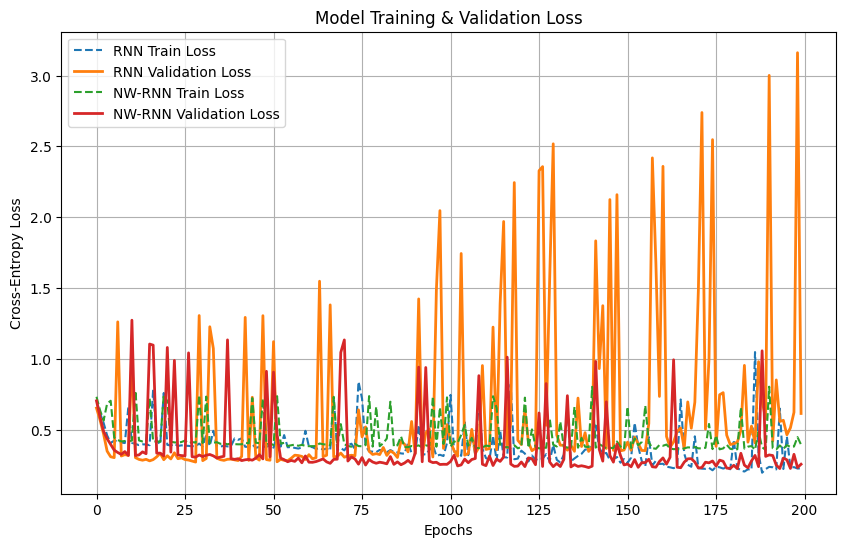

In [18]:
TRAIN_FILE_PATH = train_file_paths[0]
TEST_FILE_PATH = test_file_paths[0]
print(f"Running experiments for {names[0]} dataset")
train_loader, test_loader, val_loader, std_rnn_classifier, nw_rnn_classifier, input_size, num_classes = run_experiment_rnn_models(TRAIN_FILE_PATH, TEST_FILE_PATH)


In [19]:
print(f"Running experiments for {names[0]} dataset")
run_experiment_esn_models(train_loader, test_loader, val_loader, std_rnn_classifier, nw_rnn_classifier, input_size, num_classes)    

Running experiments for Earthquakes dataset
Carrying out Hyperparameter search for ESN and NW-ESN networks:
Running experiments on device: cuda

--- 1. Starting NW-ESN Grid Search (from Table 3a) ---
Total combinations to check: 360


NW-ESN Grid Search:   0%|          | 0/360 [00:00<?, ?it/s]

--- NW-ESN Search Complete ---
Best NW-ESN Val Acc: 90.77%
Best NW-ESN Params: {'w': 1.0, 'beta': 0.001, 'p': 0.99, 'Kp0': 0.0001, 'Kd0': 0.5, 'eta_p': 10.0, 'eta_d': 1.0, 'rescale_s': 1.5, 'gamma': 0.1, 'delta_t': 0.1}

--- 2. Starting ESN Grid Search (from Table 3c) ---
Total combinations to check: 72


ESN Grid Search:   0%|          | 0/72 [00:00<?, ?it/s]

--- ESN Search Complete ---
Best ESN Val Acc: 84.62%
Best ESN Params: {'w': 1.0, 'beta': 1.0, 'p': 0.99, 'leaking_rate': 0.5}

--- 3. Final Evaluation on Test Set (using best models) ---


Testing NW-ESN:   0%|          | 0/3 [00:00<?, ?it/s]

  Model: NW-ESN
    -> Best Validation Accuracy: 90.77%
    -> Final Test Accuracy: 76.26%
    -> Best Params: {'w': 1.0, 'beta': 0.001, 'p': 0.99, 'Kp0': 0.0001, 'Kd0': 0.5, 'eta_p': 10.0, 'eta_d': 1.0, 'rescale_s': 1.5, 'gamma': 0.1, 'delta_t': 0.1}
------------------------------------------------------
--- Generating Final Model Comparison ---


Testing RNN:   0%|          | 0/3 [00:00<?, ?it/s]

Testing NW-RNN:   0%|          | 0/3 [00:00<?, ?it/s]

Testing NW-ESN:   0%|          | 0/3 [00:00<?, ?it/s]

Testing ESN:   0%|          | 0/3 [00:00<?, ?it/s]


--- Final Model Comparison Summary ---
Model           | Test Accuracy   | Total Params    | Trainable Params
---------------------------------------------------------------------------
ESN             | 71.22         % | 10,402          | 202            
NW-ESN (ours)   | 76.26         % | 10,402          | 202            
RNN             | 74.10         % | 10,502          | 10,502         
NW-RNN (ours)   | 74.82         % | 10,402          | 10,402         
--- Measuring Model Inference Time ---
Loaded full test set onto cuda (139 samples)
Time for RNN: 3.01 ms
Time for NW-RNN (ours): 169.74 ms
Time for ESN: 76.32 ms
Time for NW-ESN (ours): 171.89 ms

--- Full Test Set Inference Time ---
Model           | Time (ms)      
----------------------------------------
ESN             | 76.32          ms
NW-ESN (ours)   | 171.89         ms
RNN             | 3.01           ms
NW-RNN (ours)   | 169.74         ms


### FordA 

Running experiments for FordA dataset
Full train set: (3601, 500)
Train set (80%): (2880, 500)
Validation set (20%): (721, 500)
Test set: (1320, 500)

Data ready for PyTorch:
Input size: 1
Output classes: 2

--- Training Standard RNN ---
Using device: cuda

Starting Standard RNN Classifier Training for 200 epochs...


Epoch 1/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 1/200 | Train Loss: 0.694515 | Val Loss: 0.693292 | Val Acc: 51.32%


Epoch 2/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 2/200 | Train Loss: 0.693419 | Val Loss: 0.693218 | Val Acc: 49.51%


Epoch 3/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 3/200 | Train Loss: 0.693030 | Val Loss: 0.692684 | Val Acc: 49.10%


Epoch 4/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 4/200 | Train Loss: 0.693135 | Val Loss: 0.693052 | Val Acc: 50.35%


Epoch 5/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 5/200 | Train Loss: 0.693088 | Val Loss: 0.692944 | Val Acc: 49.24%


Epoch 6/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 6/200 | Train Loss: 0.693134 | Val Loss: 0.693306 | Val Acc: 48.96%


Epoch 7/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 7/200 | Train Loss: 0.693500 | Val Loss: 0.693701 | Val Acc: 49.38%


Epoch 8/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 8/200 | Train Loss: 0.693158 | Val Loss: 0.692866 | Val Acc: 48.68%


Epoch 9/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 9/200 | Train Loss: 0.692993 | Val Loss: 0.694083 | Val Acc: 49.79%


Epoch 10/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 10/200 | Train Loss: 0.692832 | Val Loss: 0.693807 | Val Acc: 49.51%


Epoch 11/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 11/200 | Train Loss: 0.692705 | Val Loss: 0.693871 | Val Acc: 48.96%


Epoch 12/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 12/200 | Train Loss: 0.692817 | Val Loss: 0.694044 | Val Acc: 48.13%


Epoch 13/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 13/200 | Train Loss: 0.692821 | Val Loss: 0.692668 | Val Acc: 48.82%


Epoch 14/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 14/200 | Train Loss: 0.693151 | Val Loss: 0.692671 | Val Acc: 48.96%


Epoch 15/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 15/200 | Train Loss: 0.692746 | Val Loss: 0.693188 | Val Acc: 47.85%


Epoch 16/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 16/200 | Train Loss: 0.693110 | Val Loss: 0.693122 | Val Acc: 48.54%


Epoch 17/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 17/200 | Train Loss: 0.693136 | Val Loss: 0.694093 | Val Acc: 52.57%


Epoch 18/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 18/200 | Train Loss: 0.692456 | Val Loss: 0.693797 | Val Acc: 48.68%


Epoch 19/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 19/200 | Train Loss: 0.693000 | Val Loss: 0.693738 | Val Acc: 47.99%


Epoch 20/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 20/200 | Train Loss: 0.692678 | Val Loss: 0.693610 | Val Acc: 49.10%


Epoch 21/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 21/200 | Train Loss: 0.693043 | Val Loss: 0.693303 | Val Acc: 48.27%


Epoch 22/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 22/200 | Train Loss: 0.693103 | Val Loss: 0.693829 | Val Acc: 48.40%


Epoch 23/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 23/200 | Train Loss: 0.692944 | Val Loss: 0.692447 | Val Acc: 48.68%


Epoch 24/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 24/200 | Train Loss: 0.692708 | Val Loss: 0.693058 | Val Acc: 48.82%


Epoch 25/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 25/200 | Train Loss: 0.692728 | Val Loss: 0.693894 | Val Acc: 47.71%


Epoch 26/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 26/200 | Train Loss: 0.692900 | Val Loss: 0.694927 | Val Acc: 49.38%


Epoch 27/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 27/200 | Train Loss: 0.692843 | Val Loss: 0.693093 | Val Acc: 48.54%


Epoch 28/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 28/200 | Train Loss: 0.692873 | Val Loss: 0.693363 | Val Acc: 48.96%


Epoch 29/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 29/200 | Train Loss: 0.692741 | Val Loss: 0.693007 | Val Acc: 48.54%


Epoch 30/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 30/200 | Train Loss: 0.692750 | Val Loss: 0.693391 | Val Acc: 48.82%


Epoch 31/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 31/200 | Train Loss: 0.692638 | Val Loss: 0.693385 | Val Acc: 48.82%


Epoch 32/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 32/200 | Train Loss: 0.692582 | Val Loss: 0.693559 | Val Acc: 48.40%


Epoch 33/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 33/200 | Train Loss: 0.692626 | Val Loss: 0.693340 | Val Acc: 48.54%


Epoch 34/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 34/200 | Train Loss: 0.692680 | Val Loss: 0.693118 | Val Acc: 47.71%


Epoch 35/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 35/200 | Train Loss: 0.692683 | Val Loss: 0.694045 | Val Acc: 48.27%


Epoch 36/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 36/200 | Train Loss: 0.692787 | Val Loss: 0.693041 | Val Acc: 47.71%


Epoch 37/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 37/200 | Train Loss: 0.692703 | Val Loss: 0.693246 | Val Acc: 48.82%


Epoch 38/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 38/200 | Train Loss: 0.692729 | Val Loss: 0.694263 | Val Acc: 49.38%


Epoch 39/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 39/200 | Train Loss: 0.692687 | Val Loss: 0.693738 | Val Acc: 49.24%


Epoch 40/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 40/200 | Train Loss: 0.692681 | Val Loss: 0.694408 | Val Acc: 49.38%


Epoch 41/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 41/200 | Train Loss: 0.692904 | Val Loss: 0.693424 | Val Acc: 48.82%


Epoch 42/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 42/200 | Train Loss: 0.692501 | Val Loss: 0.693803 | Val Acc: 48.96%


Epoch 43/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 43/200 | Train Loss: 0.692501 | Val Loss: 0.693068 | Val Acc: 49.51%


Epoch 44/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 44/200 | Train Loss: 0.692644 | Val Loss: 0.692817 | Val Acc: 48.82%


Epoch 45/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 45/200 | Train Loss: 0.692573 | Val Loss: 0.693274 | Val Acc: 48.96%


Epoch 46/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 46/200 | Train Loss: 0.692519 | Val Loss: 0.693387 | Val Acc: 48.54%


Epoch 47/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 47/200 | Train Loss: 0.692725 | Val Loss: 0.692126 | Val Acc: 49.51%


Epoch 48/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 48/200 | Train Loss: 0.704244 | Val Loss: 0.702100 | Val Acc: 49.10%


Epoch 49/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 49/200 | Train Loss: 0.702918 | Val Loss: 0.694584 | Val Acc: 49.10%


Epoch 50/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 50/200 | Train Loss: 0.697459 | Val Loss: 0.692767 | Val Acc: 51.32%


Epoch 51/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 51/200 | Train Loss: 0.698193 | Val Loss: 0.695617 | Val Acc: 50.49%


Epoch 52/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 52/200 | Train Loss: 0.695075 | Val Loss: 0.695004 | Val Acc: 52.43%


Epoch 53/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 53/200 | Train Loss: 0.695901 | Val Loss: 0.697231 | Val Acc: 49.51%


Epoch 54/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 54/200 | Train Loss: 0.694262 | Val Loss: 0.694012 | Val Acc: 49.51%


Epoch 55/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 55/200 | Train Loss: 0.694068 | Val Loss: 0.696423 | Val Acc: 48.68%


Epoch 56/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 56/200 | Train Loss: 0.695208 | Val Loss: 0.691769 | Val Acc: 52.70%


Epoch 57/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 57/200 | Train Loss: 0.694598 | Val Loss: 0.693031 | Val Acc: 50.76%


Epoch 58/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 58/200 | Train Loss: 0.694094 | Val Loss: 0.692738 | Val Acc: 50.35%


Epoch 59/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 59/200 | Train Loss: 0.694349 | Val Loss: 0.692922 | Val Acc: 50.07%


Epoch 60/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 60/200 | Train Loss: 0.693264 | Val Loss: 0.693528 | Val Acc: 49.10%


Epoch 61/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 61/200 | Train Loss: 0.694380 | Val Loss: 0.693075 | Val Acc: 50.49%


Epoch 62/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 62/200 | Train Loss: 0.694874 | Val Loss: 0.695622 | Val Acc: 51.87%


Epoch 63/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 63/200 | Train Loss: 0.692027 | Val Loss: 0.694703 | Val Acc: 51.73%


Epoch 64/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 64/200 | Train Loss: 0.694754 | Val Loss: 0.694050 | Val Acc: 49.38%


Epoch 65/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 65/200 | Train Loss: 0.696450 | Val Loss: 0.699023 | Val Acc: 48.68%


Epoch 66/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 66/200 | Train Loss: 0.694557 | Val Loss: 0.695093 | Val Acc: 48.68%


Epoch 67/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 67/200 | Train Loss: 0.693964 | Val Loss: 0.692146 | Val Acc: 51.32%


Epoch 68/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 68/200 | Train Loss: 0.693334 | Val Loss: 0.693039 | Val Acc: 49.51%


Epoch 69/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 69/200 | Train Loss: 0.693579 | Val Loss: 0.693241 | Val Acc: 49.51%


Epoch 70/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 70/200 | Train Loss: 0.692825 | Val Loss: 0.692878 | Val Acc: 51.04%


Epoch 71/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 71/200 | Train Loss: 0.693516 | Val Loss: 0.693109 | Val Acc: 51.18%


Epoch 72/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 72/200 | Train Loss: 0.692898 | Val Loss: 0.693872 | Val Acc: 51.04%


Epoch 73/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 73/200 | Train Loss: 0.693457 | Val Loss: 0.693341 | Val Acc: 50.07%


Epoch 74/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 74/200 | Train Loss: 0.693993 | Val Loss: 0.693343 | Val Acc: 48.54%


Epoch 75/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 75/200 | Train Loss: 0.693259 | Val Loss: 0.695743 | Val Acc: 49.38%


Epoch 76/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 76/200 | Train Loss: 0.692210 | Val Loss: 0.693579 | Val Acc: 50.07%


Epoch 77/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 77/200 | Train Loss: 0.692787 | Val Loss: 0.692635 | Val Acc: 50.07%


Epoch 78/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 78/200 | Train Loss: 0.692786 | Val Loss: 0.694293 | Val Acc: 51.04%


Epoch 79/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 79/200 | Train Loss: 0.692488 | Val Loss: 0.698962 | Val Acc: 51.73%


Epoch 80/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 80/200 | Train Loss: 0.693621 | Val Loss: 0.693099 | Val Acc: 49.93%


Epoch 81/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 81/200 | Train Loss: 0.692760 | Val Loss: 0.695813 | Val Acc: 48.54%


Epoch 82/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 82/200 | Train Loss: 0.693641 | Val Loss: 0.695669 | Val Acc: 49.10%


Epoch 83/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 83/200 | Train Loss: 0.692959 | Val Loss: 0.694242 | Val Acc: 51.18%


Epoch 84/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 84/200 | Train Loss: 0.692298 | Val Loss: 0.694790 | Val Acc: 48.82%


Epoch 85/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 85/200 | Train Loss: 0.691799 | Val Loss: 0.693891 | Val Acc: 49.65%


Epoch 86/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 86/200 | Train Loss: 0.692037 | Val Loss: 0.697022 | Val Acc: 50.76%


Epoch 87/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 87/200 | Train Loss: 0.692072 | Val Loss: 0.694033 | Val Acc: 48.96%


Epoch 88/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 88/200 | Train Loss: 0.692203 | Val Loss: 0.695077 | Val Acc: 49.65%


Epoch 89/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 89/200 | Train Loss: 0.692295 | Val Loss: 0.695844 | Val Acc: 50.07%


Epoch 90/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 90/200 | Train Loss: 0.692050 | Val Loss: 0.694963 | Val Acc: 49.24%


Epoch 91/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 91/200 | Train Loss: 0.691628 | Val Loss: 0.697237 | Val Acc: 49.38%


Epoch 92/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 92/200 | Train Loss: 0.691308 | Val Loss: 0.695400 | Val Acc: 49.10%


Epoch 93/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 93/200 | Train Loss: 0.692084 | Val Loss: 0.695300 | Val Acc: 49.51%


Epoch 94/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 94/200 | Train Loss: 0.691820 | Val Loss: 0.695706 | Val Acc: 50.21%


Epoch 95/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 95/200 | Train Loss: 0.692116 | Val Loss: 0.696705 | Val Acc: 50.07%


Epoch 96/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 96/200 | Train Loss: 0.692230 | Val Loss: 0.695428 | Val Acc: 48.82%


Epoch 97/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 97/200 | Train Loss: 0.691192 | Val Loss: 0.694940 | Val Acc: 49.65%


Epoch 98/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 98/200 | Train Loss: 0.691387 | Val Loss: 0.696506 | Val Acc: 49.24%


Epoch 99/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 99/200 | Train Loss: 0.691729 | Val Loss: 0.696531 | Val Acc: 50.62%


Epoch 100/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 100/200 | Train Loss: 0.690417 | Val Loss: 0.695280 | Val Acc: 48.40%


Epoch 101/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 101/200 | Train Loss: 0.692027 | Val Loss: 0.696136 | Val Acc: 50.35%


Epoch 102/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 102/200 | Train Loss: 0.691464 | Val Loss: 0.698396 | Val Acc: 49.10%


Epoch 103/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 103/200 | Train Loss: 0.691558 | Val Loss: 0.694314 | Val Acc: 49.79%


Epoch 104/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 104/200 | Train Loss: 0.691065 | Val Loss: 0.696851 | Val Acc: 48.68%


Epoch 105/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 105/200 | Train Loss: 0.693464 | Val Loss: 0.693566 | Val Acc: 50.49%


Epoch 106/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 106/200 | Train Loss: 0.691530 | Val Loss: 0.696321 | Val Acc: 49.51%


Epoch 107/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 107/200 | Train Loss: 0.691649 | Val Loss: 0.698685 | Val Acc: 50.35%


Epoch 108/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 108/200 | Train Loss: 0.691392 | Val Loss: 0.698544 | Val Acc: 49.38%


Epoch 109/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 109/200 | Train Loss: 0.692613 | Val Loss: 0.695142 | Val Acc: 49.24%


Epoch 110/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 110/200 | Train Loss: 0.691474 | Val Loss: 0.698929 | Val Acc: 48.40%


Epoch 111/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 111/200 | Train Loss: 0.692560 | Val Loss: 0.694913 | Val Acc: 49.93%


Epoch 112/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 112/200 | Train Loss: 0.691494 | Val Loss: 0.697233 | Val Acc: 49.51%


Epoch 113/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 113/200 | Train Loss: 0.691677 | Val Loss: 0.697644 | Val Acc: 49.93%


Epoch 114/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 114/200 | Train Loss: 0.691339 | Val Loss: 0.696232 | Val Acc: 49.93%


Epoch 115/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 115/200 | Train Loss: 0.692207 | Val Loss: 0.696102 | Val Acc: 50.49%


Epoch 116/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 116/200 | Train Loss: 0.691270 | Val Loss: 0.694977 | Val Acc: 50.76%


Epoch 117/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 117/200 | Train Loss: 0.691411 | Val Loss: 0.696380 | Val Acc: 49.38%


Epoch 118/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 118/200 | Train Loss: 0.691495 | Val Loss: 0.698838 | Val Acc: 47.99%


Epoch 119/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 119/200 | Train Loss: 0.690510 | Val Loss: 0.694160 | Val Acc: 49.51%


Epoch 120/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 120/200 | Train Loss: 0.690860 | Val Loss: 0.696086 | Val Acc: 49.24%


Epoch 121/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 121/200 | Train Loss: 0.691129 | Val Loss: 0.696063 | Val Acc: 48.68%


Epoch 122/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 122/200 | Train Loss: 0.691066 | Val Loss: 0.697184 | Val Acc: 49.51%


Epoch 123/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 123/200 | Train Loss: 0.691740 | Val Loss: 0.698831 | Val Acc: 48.13%


Epoch 124/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 124/200 | Train Loss: 0.695055 | Val Loss: 0.693704 | Val Acc: 50.07%


Epoch 125/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 125/200 | Train Loss: 0.694271 | Val Loss: 0.696723 | Val Acc: 48.13%


Epoch 126/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 126/200 | Train Loss: 0.695451 | Val Loss: 0.694610 | Val Acc: 50.90%


Epoch 127/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 127/200 | Train Loss: 0.697953 | Val Loss: 0.695977 | Val Acc: 49.10%


Epoch 128/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 128/200 | Train Loss: 0.693696 | Val Loss: 0.693480 | Val Acc: 52.15%


Epoch 129/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 129/200 | Train Loss: 0.695462 | Val Loss: 0.696221 | Val Acc: 49.38%


Epoch 130/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 130/200 | Train Loss: 0.696284 | Val Loss: 0.693419 | Val Acc: 50.90%


Epoch 131/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 131/200 | Train Loss: 0.694945 | Val Loss: 0.697005 | Val Acc: 48.40%


Epoch 132/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 132/200 | Train Loss: 0.693842 | Val Loss: 0.697429 | Val Acc: 50.76%


Epoch 133/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 133/200 | Train Loss: 0.696171 | Val Loss: 0.695920 | Val Acc: 49.51%


Epoch 134/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 134/200 | Train Loss: 0.695339 | Val Loss: 0.694702 | Val Acc: 50.90%


Epoch 135/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 135/200 | Train Loss: 0.693996 | Val Loss: 0.695479 | Val Acc: 49.65%


Epoch 136/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 136/200 | Train Loss: 0.693458 | Val Loss: 0.695396 | Val Acc: 47.30%


Epoch 137/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 137/200 | Train Loss: 0.695235 | Val Loss: 0.700138 | Val Acc: 49.65%


Epoch 138/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 138/200 | Train Loss: 0.693591 | Val Loss: 0.696420 | Val Acc: 47.85%


Epoch 139/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 139/200 | Train Loss: 0.694317 | Val Loss: 0.695953 | Val Acc: 50.35%


Epoch 140/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 140/200 | Train Loss: 0.692992 | Val Loss: 0.694644 | Val Acc: 49.24%


Epoch 141/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 141/200 | Train Loss: 0.695727 | Val Loss: 0.696867 | Val Acc: 48.96%


Epoch 142/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 142/200 | Train Loss: 0.692036 | Val Loss: 0.698961 | Val Acc: 47.99%


Epoch 143/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 143/200 | Train Loss: 0.694402 | Val Loss: 0.696372 | Val Acc: 47.85%


Epoch 144/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 144/200 | Train Loss: 0.692036 | Val Loss: 0.697083 | Val Acc: 49.24%


Epoch 145/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 145/200 | Train Loss: 0.692032 | Val Loss: 0.697135 | Val Acc: 48.68%


Epoch 146/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 146/200 | Train Loss: 0.692580 | Val Loss: 0.699524 | Val Acc: 47.99%


Epoch 147/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 147/200 | Train Loss: 0.691512 | Val Loss: 0.696075 | Val Acc: 49.93%


Epoch 148/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 148/200 | Train Loss: 0.691467 | Val Loss: 0.698130 | Val Acc: 48.96%


Epoch 149/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 149/200 | Train Loss: 0.692870 | Val Loss: 0.697344 | Val Acc: 51.32%


Epoch 150/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 150/200 | Train Loss: 0.691269 | Val Loss: 0.696215 | Val Acc: 47.71%


Epoch 151/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 151/200 | Train Loss: 0.690608 | Val Loss: 0.697734 | Val Acc: 47.99%


Epoch 152/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 152/200 | Train Loss: 0.690533 | Val Loss: 0.696685 | Val Acc: 49.10%


Epoch 153/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 153/200 | Train Loss: 0.690719 | Val Loss: 0.702058 | Val Acc: 47.16%


Epoch 154/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 154/200 | Train Loss: 0.689649 | Val Loss: 0.702697 | Val Acc: 48.13%


Epoch 155/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 155/200 | Train Loss: 0.692672 | Val Loss: 0.696688 | Val Acc: 49.79%


Epoch 156/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 156/200 | Train Loss: 0.691408 | Val Loss: 0.702554 | Val Acc: 49.79%


Epoch 157/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 157/200 | Train Loss: 0.689826 | Val Loss: 0.699532 | Val Acc: 48.13%


Epoch 158/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 158/200 | Train Loss: 0.690856 | Val Loss: 0.700447 | Val Acc: 50.07%


Epoch 159/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 159/200 | Train Loss: 0.690287 | Val Loss: 0.696304 | Val Acc: 50.35%


Epoch 160/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 160/200 | Train Loss: 0.691513 | Val Loss: 0.696274 | Val Acc: 49.93%


Epoch 161/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 161/200 | Train Loss: 0.689253 | Val Loss: 0.697214 | Val Acc: 49.51%


Epoch 162/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 162/200 | Train Loss: 0.688456 | Val Loss: 0.699025 | Val Acc: 48.96%


Epoch 163/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 163/200 | Train Loss: 0.690482 | Val Loss: 0.699407 | Val Acc: 50.76%


Epoch 164/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 164/200 | Train Loss: 0.690015 | Val Loss: 0.698740 | Val Acc: 49.51%


Epoch 165/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 165/200 | Train Loss: 0.688185 | Val Loss: 0.700866 | Val Acc: 49.65%


Epoch 166/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 166/200 | Train Loss: 0.689770 | Val Loss: 0.696687 | Val Acc: 50.07%


Epoch 167/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 167/200 | Train Loss: 0.688671 | Val Loss: 0.702858 | Val Acc: 49.38%


Epoch 168/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 168/200 | Train Loss: 0.690465 | Val Loss: 0.697700 | Val Acc: 51.32%


Epoch 169/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 169/200 | Train Loss: 0.688142 | Val Loss: 0.699225 | Val Acc: 48.54%


Epoch 170/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 170/200 | Train Loss: 0.692138 | Val Loss: 0.699095 | Val Acc: 50.49%


Epoch 171/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 171/200 | Train Loss: 0.690701 | Val Loss: 0.698122 | Val Acc: 50.76%


Epoch 172/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 172/200 | Train Loss: 0.691260 | Val Loss: 0.701246 | Val Acc: 47.57%


Epoch 173/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 173/200 | Train Loss: 0.690989 | Val Loss: 0.699178 | Val Acc: 51.04%


Epoch 174/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 174/200 | Train Loss: 0.688178 | Val Loss: 0.695513 | Val Acc: 50.07%


Epoch 175/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 175/200 | Train Loss: 0.688419 | Val Loss: 0.695364 | Val Acc: 51.18%


Epoch 176/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 176/200 | Train Loss: 0.688176 | Val Loss: 0.701004 | Val Acc: 47.71%


Epoch 177/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 177/200 | Train Loss: 0.687586 | Val Loss: 0.695468 | Val Acc: 51.04%


Epoch 178/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 178/200 | Train Loss: 0.688868 | Val Loss: 0.698922 | Val Acc: 50.07%


Epoch 179/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 179/200 | Train Loss: 0.688017 | Val Loss: 0.698698 | Val Acc: 50.35%


Epoch 180/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 180/200 | Train Loss: 0.689529 | Val Loss: 0.695833 | Val Acc: 50.76%


Epoch 181/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 181/200 | Train Loss: 0.687686 | Val Loss: 0.699375 | Val Acc: 49.79%


Epoch 182/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 182/200 | Train Loss: 0.687507 | Val Loss: 0.700640 | Val Acc: 48.68%


Epoch 183/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 183/200 | Train Loss: 0.688020 | Val Loss: 0.700586 | Val Acc: 49.65%


Epoch 184/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 184/200 | Train Loss: 0.687935 | Val Loss: 0.700729 | Val Acc: 52.84%


Epoch 185/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 185/200 | Train Loss: 0.689105 | Val Loss: 0.697512 | Val Acc: 49.79%


Epoch 186/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 186/200 | Train Loss: 0.687361 | Val Loss: 0.699035 | Val Acc: 50.07%


Epoch 187/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 187/200 | Train Loss: 0.688641 | Val Loss: 0.699618 | Val Acc: 50.76%


Epoch 188/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 188/200 | Train Loss: 0.688536 | Val Loss: 0.697336 | Val Acc: 51.46%


Epoch 189/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 189/200 | Train Loss: 0.696470 | Val Loss: 0.694888 | Val Acc: 51.46%


Epoch 190/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 190/200 | Train Loss: 0.691701 | Val Loss: 0.695499 | Val Acc: 51.87%


Epoch 191/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 191/200 | Train Loss: 0.691875 | Val Loss: 0.701207 | Val Acc: 49.24%


Epoch 192/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 192/200 | Train Loss: 0.696052 | Val Loss: 0.694969 | Val Acc: 51.46%


Epoch 193/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 193/200 | Train Loss: 0.693663 | Val Loss: 0.701418 | Val Acc: 50.35%


Epoch 194/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 194/200 | Train Loss: 0.693911 | Val Loss: 0.700122 | Val Acc: 50.21%


Epoch 195/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 195/200 | Train Loss: 0.693138 | Val Loss: 0.699689 | Val Acc: 47.71%


Epoch 196/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 196/200 | Train Loss: 0.691643 | Val Loss: 0.696410 | Val Acc: 49.10%


Epoch 197/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 197/200 | Train Loss: 0.691725 | Val Loss: 0.698011 | Val Acc: 49.93%


Epoch 198/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 198/200 | Train Loss: 0.691234 | Val Loss: 0.695037 | Val Acc: 49.38%


Epoch 199/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 199/200 | Train Loss: 0.690778 | Val Loss: 0.693933 | Val Acc: 49.38%


Epoch 200/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 200/200 | Train Loss: 0.694407 | Val Loss: 0.697967 | Val Acc: 48.68%
Training complete.


Evaluating RNN:   0%|          | 0/21 [00:00<?, ?it/s]

Standard RNN Test Accuracy: 48.56%

--- Training NW-RNN model ---
Using device: cuda

Starting NW-RNN Classifier Training for 200 epochs...


Epoch 1/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 1/200 | Train Loss: 0.694656 | Val Loss: 0.696104 | Val Acc: 47.99%


Epoch 2/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 2/200 | Train Loss: 0.693957 | Val Loss: 0.694752 | Val Acc: 47.43%


Epoch 3/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 3/200 | Train Loss: 0.692840 | Val Loss: 0.693971 | Val Acc: 49.65%


Epoch 4/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 4/200 | Train Loss: 0.693642 | Val Loss: 0.694541 | Val Acc: 49.10%


Epoch 5/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 5/200 | Train Loss: 0.692135 | Val Loss: 0.694314 | Val Acc: 50.35%


Epoch 6/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 6/200 | Train Loss: 0.693035 | Val Loss: 0.694152 | Val Acc: 48.96%


Epoch 7/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 7/200 | Train Loss: 0.692184 | Val Loss: 0.694615 | Val Acc: 48.82%


Epoch 8/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 8/200 | Train Loss: 0.692272 | Val Loss: 0.696217 | Val Acc: 51.04%


Epoch 9/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 9/200 | Train Loss: 0.692353 | Val Loss: 0.695544 | Val Acc: 48.54%


Epoch 10/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 10/200 | Train Loss: 0.691989 | Val Loss: 0.700983 | Val Acc: 48.68%


Epoch 11/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 11/200 | Train Loss: 0.692613 | Val Loss: 0.694157 | Val Acc: 49.24%


Epoch 12/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 12/200 | Train Loss: 0.691721 | Val Loss: 0.695321 | Val Acc: 51.60%


Epoch 13/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 13/200 | Train Loss: 0.692259 | Val Loss: 0.694024 | Val Acc: 49.24%


Epoch 14/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 14/200 | Train Loss: 0.692816 | Val Loss: 0.696555 | Val Acc: 47.99%


Epoch 15/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 15/200 | Train Loss: 0.691491 | Val Loss: 0.694760 | Val Acc: 48.96%


Epoch 16/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 16/200 | Train Loss: 0.691669 | Val Loss: 0.695096 | Val Acc: 46.74%


Epoch 17/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 17/200 | Train Loss: 0.691927 | Val Loss: 0.696489 | Val Acc: 48.27%


Epoch 18/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 18/200 | Train Loss: 0.691677 | Val Loss: 0.694729 | Val Acc: 47.43%


Epoch 19/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 19/200 | Train Loss: 0.692126 | Val Loss: 0.695551 | Val Acc: 49.38%


Epoch 20/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 20/200 | Train Loss: 0.692329 | Val Loss: 0.696550 | Val Acc: 49.79%


Epoch 21/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 21/200 | Train Loss: 0.691316 | Val Loss: 0.695282 | Val Acc: 50.07%


Epoch 22/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 22/200 | Train Loss: 0.692509 | Val Loss: 0.695975 | Val Acc: 49.10%


Epoch 23/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 23/200 | Train Loss: 0.691517 | Val Loss: 0.694538 | Val Acc: 49.38%


Epoch 24/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 24/200 | Train Loss: 0.691346 | Val Loss: 0.697017 | Val Acc: 49.38%


Epoch 25/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 25/200 | Train Loss: 0.692013 | Val Loss: 0.695982 | Val Acc: 48.82%


Epoch 26/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 26/200 | Train Loss: 0.691420 | Val Loss: 0.696390 | Val Acc: 49.93%


Epoch 27/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 27/200 | Train Loss: 0.691737 | Val Loss: 0.697421 | Val Acc: 50.21%


Epoch 28/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 28/200 | Train Loss: 0.690656 | Val Loss: 0.696960 | Val Acc: 50.90%


Epoch 29/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 29/200 | Train Loss: 0.691888 | Val Loss: 0.696753 | Val Acc: 47.30%


Epoch 30/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 30/200 | Train Loss: 0.691452 | Val Loss: 0.695098 | Val Acc: 48.82%


Epoch 31/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 31/200 | Train Loss: 0.691416 | Val Loss: 0.695321 | Val Acc: 47.30%


Epoch 32/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 32/200 | Train Loss: 0.691161 | Val Loss: 0.695371 | Val Acc: 50.49%


Epoch 33/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 33/200 | Train Loss: 0.690845 | Val Loss: 0.698676 | Val Acc: 50.21%


Epoch 34/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 34/200 | Train Loss: 0.691355 | Val Loss: 0.695567 | Val Acc: 47.71%


Epoch 35/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 35/200 | Train Loss: 0.690944 | Val Loss: 0.694133 | Val Acc: 48.27%


Epoch 36/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 36/200 | Train Loss: 0.690912 | Val Loss: 0.696325 | Val Acc: 50.62%


Epoch 37/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 37/200 | Train Loss: 0.690584 | Val Loss: 0.700214 | Val Acc: 49.65%


Epoch 38/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 38/200 | Train Loss: 0.692100 | Val Loss: 0.697452 | Val Acc: 48.82%


Epoch 39/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 39/200 | Train Loss: 0.691598 | Val Loss: 0.695449 | Val Acc: 50.76%


Epoch 40/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 40/200 | Train Loss: 0.691587 | Val Loss: 0.694707 | Val Acc: 48.82%


Epoch 41/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 41/200 | Train Loss: 0.691043 | Val Loss: 0.696332 | Val Acc: 50.62%


Epoch 42/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 42/200 | Train Loss: 0.691037 | Val Loss: 0.696141 | Val Acc: 48.82%


Epoch 43/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 43/200 | Train Loss: 0.691529 | Val Loss: 0.694853 | Val Acc: 49.93%


Epoch 44/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 44/200 | Train Loss: 0.692083 | Val Loss: 0.695653 | Val Acc: 49.65%


Epoch 45/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 45/200 | Train Loss: 0.691925 | Val Loss: 0.694869 | Val Acc: 47.57%


Epoch 46/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 46/200 | Train Loss: 0.690937 | Val Loss: 0.695422 | Val Acc: 47.57%


Epoch 47/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 47/200 | Train Loss: 0.691003 | Val Loss: 0.696367 | Val Acc: 48.27%


Epoch 48/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 48/200 | Train Loss: 0.690928 | Val Loss: 0.696542 | Val Acc: 47.71%


Epoch 49/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 49/200 | Train Loss: 0.690736 | Val Loss: 0.695832 | Val Acc: 48.40%


Epoch 50/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 50/200 | Train Loss: 0.691208 | Val Loss: 0.696735 | Val Acc: 49.65%


Epoch 51/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 51/200 | Train Loss: 0.690528 | Val Loss: 0.696128 | Val Acc: 48.40%


Epoch 52/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 52/200 | Train Loss: 0.690890 | Val Loss: 0.694643 | Val Acc: 48.54%


Epoch 53/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 53/200 | Train Loss: 0.690585 | Val Loss: 0.695463 | Val Acc: 48.40%


Epoch 54/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 54/200 | Train Loss: 0.691047 | Val Loss: 0.695355 | Val Acc: 47.57%


Epoch 55/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 55/200 | Train Loss: 0.690221 | Val Loss: 0.694820 | Val Acc: 47.85%


Epoch 56/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 56/200 | Train Loss: 0.690184 | Val Loss: 0.696780 | Val Acc: 48.27%


Epoch 57/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 57/200 | Train Loss: 0.691055 | Val Loss: 0.697242 | Val Acc: 48.82%


Epoch 58/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 58/200 | Train Loss: 0.689707 | Val Loss: 0.696023 | Val Acc: 49.93%


Epoch 59/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 59/200 | Train Loss: 0.692183 | Val Loss: 0.699316 | Val Acc: 50.90%


Epoch 60/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 60/200 | Train Loss: 0.690867 | Val Loss: 0.696454 | Val Acc: 47.85%


Epoch 61/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 61/200 | Train Loss: 0.691734 | Val Loss: 0.695879 | Val Acc: 49.38%


Epoch 62/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 62/200 | Train Loss: 0.691244 | Val Loss: 0.694866 | Val Acc: 48.54%


Epoch 63/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 63/200 | Train Loss: 0.689992 | Val Loss: 0.694588 | Val Acc: 49.79%


Epoch 64/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 64/200 | Train Loss: 0.690047 | Val Loss: 0.694946 | Val Acc: 48.96%


Epoch 65/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 65/200 | Train Loss: 0.689859 | Val Loss: 0.694208 | Val Acc: 49.38%


Epoch 66/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 66/200 | Train Loss: 0.690305 | Val Loss: 0.697159 | Val Acc: 49.38%


Epoch 67/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 67/200 | Train Loss: 0.689455 | Val Loss: 0.695326 | Val Acc: 50.35%


Epoch 68/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 68/200 | Train Loss: 0.688623 | Val Loss: 0.694761 | Val Acc: 48.96%


Epoch 69/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 69/200 | Train Loss: 0.689193 | Val Loss: 0.695573 | Val Acc: 50.90%


Epoch 70/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 70/200 | Train Loss: 0.688895 | Val Loss: 0.694401 | Val Acc: 49.79%


Epoch 71/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 71/200 | Train Loss: 0.688043 | Val Loss: 0.694280 | Val Acc: 49.51%


Epoch 72/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 72/200 | Train Loss: 0.687641 | Val Loss: 0.693763 | Val Acc: 51.60%


Epoch 73/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 73/200 | Train Loss: 0.687044 | Val Loss: 0.692705 | Val Acc: 50.21%


Epoch 74/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 74/200 | Train Loss: 0.687126 | Val Loss: 0.700016 | Val Acc: 50.35%


Epoch 75/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 75/200 | Train Loss: 0.691733 | Val Loss: 0.696486 | Val Acc: 50.21%


Epoch 76/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 76/200 | Train Loss: 0.691612 | Val Loss: 0.694682 | Val Acc: 49.51%


Epoch 77/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 77/200 | Train Loss: 0.690420 | Val Loss: 0.693194 | Val Acc: 49.24%


Epoch 78/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 78/200 | Train Loss: 0.689811 | Val Loss: 0.695926 | Val Acc: 50.21%


Epoch 79/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 79/200 | Train Loss: 0.688867 | Val Loss: 0.691782 | Val Acc: 51.46%


Epoch 80/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 80/200 | Train Loss: 0.687399 | Val Loss: 0.702073 | Val Acc: 49.10%


Epoch 81/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 81/200 | Train Loss: 0.688304 | Val Loss: 0.693467 | Val Acc: 50.90%


Epoch 82/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 82/200 | Train Loss: 0.684294 | Val Loss: 0.704359 | Val Acc: 45.49%


Epoch 83/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 83/200 | Train Loss: 0.687678 | Val Loss: 0.695648 | Val Acc: 49.65%


Epoch 84/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 84/200 | Train Loss: 0.689391 | Val Loss: 0.694629 | Val Acc: 50.07%


Epoch 85/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 85/200 | Train Loss: 0.687798 | Val Loss: 0.695128 | Val Acc: 50.90%


Epoch 86/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 86/200 | Train Loss: 0.681735 | Val Loss: 0.684425 | Val Acc: 55.89%


Epoch 87/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 87/200 | Train Loss: 0.677831 | Val Loss: 0.691825 | Val Acc: 50.90%


Epoch 88/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 88/200 | Train Loss: 0.677881 | Val Loss: 0.681598 | Val Acc: 55.62%


Epoch 89/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 89/200 | Train Loss: 0.671998 | Val Loss: 0.678330 | Val Acc: 58.11%


Epoch 90/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 90/200 | Train Loss: 0.671582 | Val Loss: 0.721192 | Val Acc: 48.54%


Epoch 91/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 91/200 | Train Loss: 0.694635 | Val Loss: 0.696144 | Val Acc: 53.26%


Epoch 92/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 92/200 | Train Loss: 0.682191 | Val Loss: 0.696773 | Val Acc: 49.93%


Epoch 93/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 93/200 | Train Loss: 0.663947 | Val Loss: 0.700484 | Val Acc: 53.54%


Epoch 94/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 94/200 | Train Loss: 0.643693 | Val Loss: 0.634173 | Val Acc: 60.19%


Epoch 95/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 95/200 | Train Loss: 0.641872 | Val Loss: 0.655627 | Val Acc: 61.03%


Epoch 96/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 96/200 | Train Loss: 0.632323 | Val Loss: 0.630959 | Val Acc: 64.63%


Epoch 97/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 97/200 | Train Loss: 0.641929 | Val Loss: 0.644399 | Val Acc: 63.80%


Epoch 98/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 98/200 | Train Loss: 0.623243 | Val Loss: 0.649203 | Val Acc: 58.53%


Epoch 99/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 99/200 | Train Loss: 0.637366 | Val Loss: 0.737951 | Val Acc: 53.26%


Epoch 100/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 100/200 | Train Loss: 0.656101 | Val Loss: 0.638160 | Val Acc: 62.55%


Epoch 101/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 101/200 | Train Loss: 0.635571 | Val Loss: 0.654996 | Val Acc: 59.92%


Epoch 102/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 102/200 | Train Loss: 0.616790 | Val Loss: 0.629453 | Val Acc: 63.66%


Epoch 103/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 103/200 | Train Loss: 0.630209 | Val Loss: 0.639842 | Val Acc: 63.11%


Epoch 104/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 104/200 | Train Loss: 0.608969 | Val Loss: 0.645884 | Val Acc: 63.66%


Epoch 105/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 105/200 | Train Loss: 0.615590 | Val Loss: 0.620348 | Val Acc: 66.57%


Epoch 106/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 106/200 | Train Loss: 0.628642 | Val Loss: 0.622523 | Val Acc: 64.63%


Epoch 107/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 107/200 | Train Loss: 0.617858 | Val Loss: 0.612341 | Val Acc: 66.57%


Epoch 108/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 108/200 | Train Loss: 0.608417 | Val Loss: 0.630086 | Val Acc: 64.08%


Epoch 109/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 109/200 | Train Loss: 0.616857 | Val Loss: 0.609286 | Val Acc: 66.99%


Epoch 110/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 110/200 | Train Loss: 0.618500 | Val Loss: 0.614424 | Val Acc: 65.19%


Epoch 111/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 111/200 | Train Loss: 0.600585 | Val Loss: 0.598082 | Val Acc: 66.02%


Epoch 112/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 112/200 | Train Loss: 0.597638 | Val Loss: 0.626083 | Val Acc: 64.36%


Epoch 113/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 113/200 | Train Loss: 0.596629 | Val Loss: 0.616892 | Val Acc: 65.88%


Epoch 114/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 114/200 | Train Loss: 0.594226 | Val Loss: 0.609615 | Val Acc: 67.13%


Epoch 115/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 115/200 | Train Loss: 0.594339 | Val Loss: 0.600424 | Val Acc: 65.74%


Epoch 116/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 116/200 | Train Loss: 0.586772 | Val Loss: 0.604176 | Val Acc: 65.74%


Epoch 117/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 117/200 | Train Loss: 0.592658 | Val Loss: 0.585696 | Val Acc: 68.10%


Epoch 118/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 118/200 | Train Loss: 0.589668 | Val Loss: 0.585735 | Val Acc: 66.99%


Epoch 119/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 119/200 | Train Loss: 0.590895 | Val Loss: 0.588640 | Val Acc: 67.82%


Epoch 120/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 120/200 | Train Loss: 0.577504 | Val Loss: 0.583816 | Val Acc: 67.96%


Epoch 121/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 121/200 | Train Loss: 0.597520 | Val Loss: 0.713270 | Val Acc: 61.44%


Epoch 122/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 122/200 | Train Loss: 0.625796 | Val Loss: 0.614124 | Val Acc: 65.05%


Epoch 123/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 123/200 | Train Loss: 0.592282 | Val Loss: 0.603218 | Val Acc: 67.96%


Epoch 124/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 124/200 | Train Loss: 0.588639 | Val Loss: 0.580536 | Val Acc: 66.99%


Epoch 125/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 125/200 | Train Loss: 0.620737 | Val Loss: 0.643176 | Val Acc: 61.44%


Epoch 126/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 126/200 | Train Loss: 0.615473 | Val Loss: 0.623388 | Val Acc: 65.46%


Epoch 127/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 127/200 | Train Loss: 0.591417 | Val Loss: 0.587505 | Val Acc: 67.82%


Epoch 128/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 128/200 | Train Loss: 0.589328 | Val Loss: 0.637363 | Val Acc: 63.25%


Epoch 129/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 129/200 | Train Loss: 0.600937 | Val Loss: 0.579057 | Val Acc: 68.24%


Epoch 130/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 130/200 | Train Loss: 0.576894 | Val Loss: 0.568658 | Val Acc: 68.24%


Epoch 131/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 131/200 | Train Loss: 0.575626 | Val Loss: 0.575703 | Val Acc: 67.82%


Epoch 132/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 132/200 | Train Loss: 0.591143 | Val Loss: 0.604189 | Val Acc: 65.88%


Epoch 133/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 133/200 | Train Loss: 0.588833 | Val Loss: 0.575828 | Val Acc: 67.41%


Epoch 134/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 134/200 | Train Loss: 0.588290 | Val Loss: 0.582788 | Val Acc: 68.79%


Epoch 135/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 135/200 | Train Loss: 0.629194 | Val Loss: 0.605823 | Val Acc: 66.30%


Epoch 136/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 136/200 | Train Loss: 0.580487 | Val Loss: 0.597375 | Val Acc: 66.99%


Epoch 137/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 137/200 | Train Loss: 0.585468 | Val Loss: 0.592021 | Val Acc: 69.76%


Epoch 138/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 138/200 | Train Loss: 0.591244 | Val Loss: 0.596255 | Val Acc: 67.13%


Epoch 139/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 139/200 | Train Loss: 0.592805 | Val Loss: 0.578738 | Val Acc: 67.96%


Epoch 140/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 140/200 | Train Loss: 0.573412 | Val Loss: 0.601091 | Val Acc: 67.27%


Epoch 141/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 141/200 | Train Loss: 0.586873 | Val Loss: 0.597785 | Val Acc: 67.27%


Epoch 142/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 142/200 | Train Loss: 0.579573 | Val Loss: 0.590012 | Val Acc: 66.85%


Epoch 143/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 143/200 | Train Loss: 0.575739 | Val Loss: 0.568506 | Val Acc: 70.32%


Epoch 144/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 144/200 | Train Loss: 0.564209 | Val Loss: 0.560058 | Val Acc: 69.90%


Epoch 145/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 145/200 | Train Loss: 0.575570 | Val Loss: 0.570606 | Val Acc: 69.07%


Epoch 146/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 146/200 | Train Loss: 0.577214 | Val Loss: 0.567224 | Val Acc: 68.93%


Epoch 147/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 147/200 | Train Loss: 0.558571 | Val Loss: 0.560380 | Val Acc: 69.35%


Epoch 148/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 148/200 | Train Loss: 0.561383 | Val Loss: 0.576916 | Val Acc: 69.07%


Epoch 149/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 149/200 | Train Loss: 0.600177 | Val Loss: 0.568016 | Val Acc: 69.63%


Epoch 150/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 150/200 | Train Loss: 0.561737 | Val Loss: 0.592779 | Val Acc: 66.71%


Epoch 151/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 151/200 | Train Loss: 0.570122 | Val Loss: 0.562559 | Val Acc: 70.46%


Epoch 152/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 152/200 | Train Loss: 0.568965 | Val Loss: 0.591177 | Val Acc: 67.82%


Epoch 153/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 153/200 | Train Loss: 0.579151 | Val Loss: 0.581770 | Val Acc: 69.21%


Epoch 154/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 154/200 | Train Loss: 0.557460 | Val Loss: 0.570317 | Val Acc: 69.63%


Epoch 155/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 155/200 | Train Loss: 0.558500 | Val Loss: 0.562326 | Val Acc: 68.93%


Epoch 156/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 156/200 | Train Loss: 0.556498 | Val Loss: 0.564190 | Val Acc: 68.52%


Epoch 157/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 157/200 | Train Loss: 0.557766 | Val Loss: 0.551381 | Val Acc: 70.18%


Epoch 158/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 158/200 | Train Loss: 0.555132 | Val Loss: 0.567775 | Val Acc: 69.07%


Epoch 159/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 159/200 | Train Loss: 0.561602 | Val Loss: 0.600680 | Val Acc: 64.08%


Epoch 160/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 160/200 | Train Loss: 0.567068 | Val Loss: 0.592317 | Val Acc: 67.27%


Epoch 161/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 161/200 | Train Loss: 0.558513 | Val Loss: 0.582227 | Val Acc: 69.07%


Epoch 162/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 162/200 | Train Loss: 0.568096 | Val Loss: 0.575005 | Val Acc: 68.10%


Epoch 163/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 163/200 | Train Loss: 0.563233 | Val Loss: 0.684368 | Val Acc: 58.53%


Epoch 164/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 164/200 | Train Loss: 0.578066 | Val Loss: 0.557419 | Val Acc: 69.63%


Epoch 165/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 165/200 | Train Loss: 0.600176 | Val Loss: 0.551732 | Val Acc: 69.35%


Epoch 166/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 166/200 | Train Loss: 0.569522 | Val Loss: 0.548893 | Val Acc: 70.60%


Epoch 167/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 167/200 | Train Loss: 0.556318 | Val Loss: 0.549066 | Val Acc: 70.32%


Epoch 168/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 168/200 | Train Loss: 0.558413 | Val Loss: 0.555985 | Val Acc: 70.18%


Epoch 169/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 169/200 | Train Loss: 0.574636 | Val Loss: 0.560796 | Val Acc: 69.76%


Epoch 170/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 170/200 | Train Loss: 0.564518 | Val Loss: 0.552535 | Val Acc: 69.21%


Epoch 171/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 171/200 | Train Loss: 0.550564 | Val Loss: 0.562884 | Val Acc: 71.43%


Epoch 172/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 172/200 | Train Loss: 0.566330 | Val Loss: 0.559182 | Val Acc: 69.90%


Epoch 173/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 173/200 | Train Loss: 0.551112 | Val Loss: 0.553094 | Val Acc: 69.90%


Epoch 174/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 174/200 | Train Loss: 0.563967 | Val Loss: 0.604703 | Val Acc: 65.05%


Epoch 175/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 175/200 | Train Loss: 0.571758 | Val Loss: 0.565885 | Val Acc: 67.82%


Epoch 176/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 176/200 | Train Loss: 0.557769 | Val Loss: 0.665786 | Val Acc: 60.06%


Epoch 177/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 177/200 | Train Loss: 0.572504 | Val Loss: 0.560420 | Val Acc: 69.07%


Epoch 178/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 178/200 | Train Loss: 0.546132 | Val Loss: 0.543284 | Val Acc: 70.74%


Epoch 179/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 179/200 | Train Loss: 0.551769 | Val Loss: 0.562651 | Val Acc: 69.21%


Epoch 180/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 180/200 | Train Loss: 0.549606 | Val Loss: 0.538800 | Val Acc: 71.43%


Epoch 181/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 181/200 | Train Loss: 0.561603 | Val Loss: 0.618015 | Val Acc: 64.36%


Epoch 182/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 182/200 | Train Loss: 0.541437 | Val Loss: 0.545750 | Val Acc: 70.87%


Epoch 183/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 183/200 | Train Loss: 0.542742 | Val Loss: 0.535669 | Val Acc: 71.98%


Epoch 184/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 184/200 | Train Loss: 0.553760 | Val Loss: 0.542959 | Val Acc: 71.98%


Epoch 185/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 185/200 | Train Loss: 0.563316 | Val Loss: 0.568545 | Val Acc: 71.01%


Epoch 186/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 186/200 | Train Loss: 0.555777 | Val Loss: 0.555629 | Val Acc: 71.15%


Epoch 187/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 187/200 | Train Loss: 0.537699 | Val Loss: 0.541776 | Val Acc: 70.87%


Epoch 188/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 188/200 | Train Loss: 0.572846 | Val Loss: 0.582697 | Val Acc: 65.74%


Epoch 189/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 189/200 | Train Loss: 0.590120 | Val Loss: 0.559162 | Val Acc: 70.18%


Epoch 190/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 190/200 | Train Loss: 0.557048 | Val Loss: 0.542449 | Val Acc: 70.18%


Epoch 191/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 191/200 | Train Loss: 0.554214 | Val Loss: 0.557483 | Val Acc: 68.93%


Epoch 192/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 192/200 | Train Loss: 0.557361 | Val Loss: 0.545596 | Val Acc: 72.26%


Epoch 193/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 193/200 | Train Loss: 0.566694 | Val Loss: 0.942191 | Val Acc: 54.37%


Epoch 194/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 194/200 | Train Loss: 0.564990 | Val Loss: 0.535835 | Val Acc: 71.43%


Epoch 195/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 195/200 | Train Loss: 0.576105 | Val Loss: 0.546954 | Val Acc: 70.74%


Epoch 196/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 196/200 | Train Loss: 0.561966 | Val Loss: 0.586069 | Val Acc: 66.85%


Epoch 197/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 197/200 | Train Loss: 0.542904 | Val Loss: 0.598279 | Val Acc: 67.96%


Epoch 198/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 198/200 | Train Loss: 0.539813 | Val Loss: 0.538693 | Val Acc: 70.74%


Epoch 199/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 199/200 | Train Loss: 0.552312 | Val Loss: 0.545099 | Val Acc: 69.76%


Epoch 200/200 (Train):   0%|          | 0/45 [00:00<?, ?it/s]

Epoch 200/200 | Train Loss: 0.555273 | Val Loss: 0.549177 | Val Acc: 70.46%
Training complete.


Evaluating:   0%|          | 0/21 [00:00<?, ?it/s]

NW-RNN Test Accuracy: 69.17%


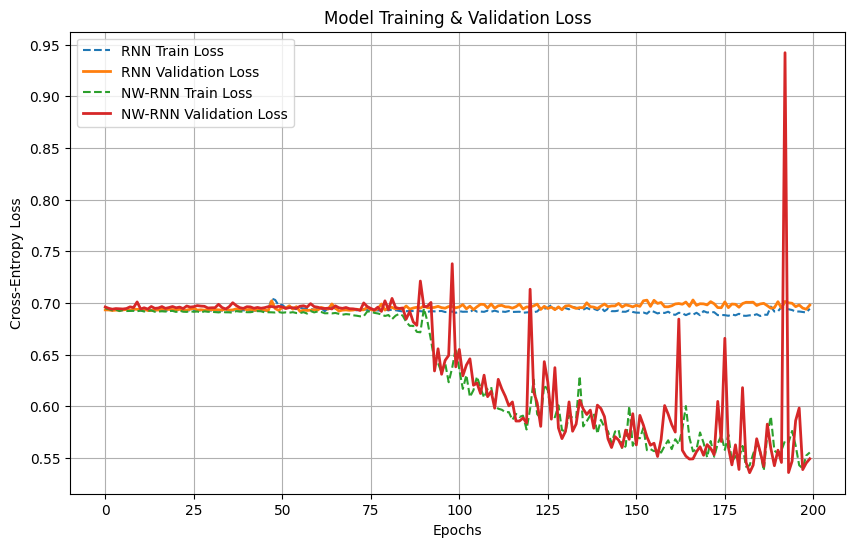

In [20]:
TRAIN_FILE_PATH = train_file_paths[1]
TEST_FILE_PATH = test_file_paths[1]
print(f"Running experiments for {names[1]} dataset")
train_loader, test_loader, val_loader, std_rnn_classifier, nw_rnn_classifier, input_size, num_classes = run_experiment_rnn_models(TRAIN_FILE_PATH, TEST_FILE_PATH)


In [21]:
print(f"Running experiments for {names[1]} dataset")
run_experiment_esn_models(train_loader, test_loader, val_loader, std_rnn_classifier, nw_rnn_classifier, input_size, num_classes)    

Running experiments for FordA dataset
Carrying out Hyperparameter search for ESN and NW-ESN networks:
Running experiments on device: cuda

--- 1. Starting NW-ESN Grid Search (from Table 3a) ---
Total combinations to check: 360


NW-ESN Grid Search:   0%|          | 0/360 [00:00<?, ?it/s]

--- NW-ESN Search Complete ---
Best NW-ESN Val Acc: 53.68%
Best NW-ESN Params: {'w': 1.0, 'beta': 1.0, 'p': 0.99, 'Kp0': 0.0001, 'Kd0': 0.5, 'eta_p': 10.0, 'eta_d': 1.0, 'rescale_s': 1.5, 'gamma': 1.0, 'delta_t': 0.001}

--- 2. Starting ESN Grid Search (from Table 3c) ---
Total combinations to check: 72


ESN Grid Search:   0%|          | 0/72 [00:00<?, ?it/s]

--- ESN Search Complete ---
Best ESN Val Acc: 51.46%
Best ESN Params: {'w': 10.0, 'beta': 1.0, 'p': 0.95, 'leaking_rate': 0.5}

--- 3. Final Evaluation on Test Set (using best models) ---


Testing NW-ESN:   0%|          | 0/21 [00:00<?, ?it/s]

  Model: NW-ESN
    -> Best Validation Accuracy: 53.68%
    -> Final Test Accuracy: 55.83%
    -> Best Params: {'w': 1.0, 'beta': 1.0, 'p': 0.99, 'Kp0': 0.0001, 'Kd0': 0.5, 'eta_p': 10.0, 'eta_d': 1.0, 'rescale_s': 1.5, 'gamma': 1.0, 'delta_t': 0.001}
------------------------------------------------------
--- Generating Final Model Comparison ---


Testing RNN:   0%|          | 0/21 [00:00<?, ?it/s]

Testing NW-RNN:   0%|          | 0/21 [00:00<?, ?it/s]

Testing NW-ESN:   0%|          | 0/21 [00:00<?, ?it/s]

Testing ESN:   0%|          | 0/21 [00:00<?, ?it/s]


--- Final Model Comparison Summary ---
Model           | Test Accuracy   | Total Params    | Trainable Params
---------------------------------------------------------------------------
ESN             | 49.39         % | 10,402          | 202            
NW-ESN (ours)   | 55.83         % | 10,402          | 202            
RNN             | 48.56         % | 10,502          | 10,502         
NW-RNN (ours)   | 69.17         % | 10,402          | 10,402         
--- Measuring Model Inference Time ---
Loaded full test set onto cuda (1320 samples)
Time for RNN: 18.61 ms
Time for NW-RNN (ours): 157.46 ms
Time for ESN: 70.09 ms
Time for NW-ESN (ours): 156.61 ms

--- Full Test Set Inference Time ---
Model           | Time (ms)      
----------------------------------------
ESN             | 70.09          ms
NW-ESN (ours)   | 156.61         ms
RNN             | 18.61          ms
NW-RNN (ours)   | 157.46         ms
